In [1]:
from capture_utils_v2 import CaptureSystem
import cv2
import pickle
from aruco_pose import get_camera_angles_from_frame
# Initialize the capture system
import matplotlib.pyplot as plt
system = CaptureSystem()


Camera Matrix:
[[1.04739831e+03 0.00000000e+00 3.24036999e+02]
 [0.00000000e+00 9.50491793e+02 3.23897832e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Distortion Coefficients: [ 2.60138074e-01 -4.37871352e+00  3.56370583e-02 -2.58297180e-03
  2.21970709e+01]
Pixel format set to RGB8
IC4 Grabber and Sink initialized.


c:\Users\danny\anaconda3\envs\py310\lib\site-packages\pandas\core\arrays\masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
import numpy as np

In [3]:
import glob
import os
import pickle as pkl
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
photometric_calibrations_dir = './photometric_calibrations'
# load latest photometric calibration by time
# photometric_calibration_files = glob.glob(os.path.join(photometric_calibrations_dir, 'photometric_calibration_*.pkl'))
photometric_calibration_files = glob.glob(os.path.join(photometric_calibrations_dir, 'photometric_calibration_*.pkl'))
photometric_calibration_files.sort(key=os.path.getmtime, reverse=True)
photometric_calibration_path = photometric_calibration_files[0]
print(f'############## Loading photometric calibration data from {photometric_calibration_path} ##############')
with open(photometric_calibration_path, "rb") as f:
    data = pkl.load(f)
import torchvision
resizer = torchvision.transforms.Resize((data['height'], data['width']))

augmentor_model = data['augmentor'].to(device).eval()


############## Loading photometric calibration data from ./photometric_calibrations\photometric_calibration_20260111_013623.pkl ##############


In [4]:
# # ============================================================================
# # VALIDATE TRANSFER FUNCTION MONOTONICITY
# # ============================================================================
# # Transfer functions should be monotonic (increasing x -> increasing y)
# # Non-monotonic functions cause searchsorted to return incorrect indices

# def check_transfer_function_monotonicity(model, raise_exception=True):
#     """
#     Check if transfer functions are monotonic.
    
#     Args:
#         model: The augmentor model with x_data_tensor and y_data_tensor
#         raise_exception: If True, raise exception when non-monotonic data found
        
#     Returns:
#         dict with monotonicity statistics
#     """
#     x_data = model.x_data_tensor.cpu()
#     y_data = model.y_data_tensor.cpu()
    
#     C, H, W, N = x_data.shape
#     total_intervals = C * H * W * (N - 1)
    
#     # Check x monotonicity (should always be sorted for searchsorted)
#     x_diff = torch.diff(x_data, dim=-1)
#     x_non_mono_count = (x_diff < 0).sum().item()
#     x_mono_violations = torch.where(x_diff < 0)
    
#     # Check y monotonicity (ideally should be monotonic for proper interpolation)
#     y_diff = torch.diff(y_data, dim=-1)
#     y_non_mono_count = (y_diff < 0).sum().item()
#     y_mono_violations = torch.where(y_diff < 0)
    
#     # Calculate percentages
#     x_violation_pct = (x_non_mono_count / total_intervals) * 100
#     y_violation_pct = (y_non_mono_count / total_intervals) * 100
    
#     # Count affected pixels
#     if x_non_mono_count > 0:
#         x_affected_pixels = len(torch.unique(torch.stack([x_mono_violations[0], 
#                                                            x_mono_violations[1], 
#                                                            x_mono_violations[2]], dim=1), dim=0))
#     else:
#         x_affected_pixels = 0
        
#     if y_non_mono_count > 0:
#         y_affected_pixels = len(torch.unique(torch.stack([y_mono_violations[0], 
#                                                            y_mono_violations[1], 
#                                                            y_mono_violations[2]], dim=1), dim=0))
#     else:
#         y_affected_pixels = 0
    
#     total_pixels = C * H * W
    
#     # Print report
#     print("=" * 60)
#     print("TRANSFER FUNCTION MONOTONICITY CHECK")
#     print("=" * 60)
#     print(f"\nData shape: {C} channels × {H}×{W} pixels × {N} samples")
#     print(f"Total intervals checked: {total_intervals:,}")
    
#     print(f"\n--- X-Values (Input) Monotonicity ---")
#     print(f"  Non-monotonic intervals: {x_non_mono_count:,} ({x_violation_pct:.4f}%)")
#     print(f"  Affected pixels: {x_affected_pixels:,} / {total_pixels:,}")
#     if x_non_mono_count > 0:
#         print(f"  ⚠️  WARNING: X values should be sorted for searchsorted!")
#     else:
#         print(f"  ✓ X values are properly sorted")
    
#     print(f"\n--- Y-Values (Output) Monotonicity ---")
#     print(f"  Non-monotonic intervals: {y_non_mono_count:,} ({y_violation_pct:.4f}%)")
#     print(f"  Affected pixels: {y_affected_pixels:,} / {total_pixels:,}")
#     if y_non_mono_count > 0:
#         print(f"  ⚠️  WARNING: Non-monotonic Y values may cause interpolation errors!")
#     else:
#         print(f"  ✓ Y values are monotonic")
    
#     print("=" * 60)
    
#     # Raise exception if requested and violations found
#     if raise_exception:
#         if x_non_mono_count > 0:
#             # Get sample of non-monotonic pixel indices (limit to first 10 for readability)
#             sample_size = min(10, len(x_mono_violations[0]))
#             sample_indices = [(x_mono_violations[0][i].item(), 
#                                x_mono_violations[1][i].item(), 
#                                x_mono_violations[2][i].item()) for i in range(sample_size)]
#             raise ValueError(
#                 f"CRITICAL: X-values are not sorted! Found {x_non_mono_count:,} non-monotonic intervals "
#                 f"({x_violation_pct:.4f}%) affecting {x_affected_pixels:,} pixels. "
#                 f"searchsorted will produce incorrect results. "
#                 f"Fix: Sort calibration data by x-values.\n"
#                 f"Sample non-monotonic pixels (channel, h, w): {sample_indices}"
#             )
#         if y_non_mono_count > 0:
#             # Get sample of non-monotonic pixel indices (limit to first 10 for readability)
#             sample_size = min(10, len(y_mono_violations[0]))
#             sample_indices = [(y_mono_violations[0][i].item(), 
#                                y_mono_violations[1][i].item(), 
#                                y_mono_violations[2][i].item()) for i in range(sample_size)]
#             raise ValueError(
#                 f"Non-monotonic transfer functions detected! Found {y_non_mono_count:,} intervals "
#                 f"({y_violation_pct:.4f}%) where increasing input leads to decreasing output. "
#                 f"This affects {y_affected_pixels:,} pixels and will cause interpolation errors. "
#                 f"Fix: Use enforce_monotonicity_vectorized() or recalibrate.\n"
#                 f"Sample non-monotonic pixels (channel, h, w): {sample_indices}"
#             )
    
#     return {
#         'x_non_mono_count': x_non_mono_count,
#         'y_non_mono_count': y_non_mono_count,
#         'x_violation_pct': x_violation_pct,
#         'y_violation_pct': y_violation_pct,
#         'x_affected_pixels': x_affected_pixels,
#         'y_affected_pixels': y_affected_pixels,
#         'total_pixels': total_pixels,
#         'total_intervals': total_intervals
#     }

# # Run the check (set raise_exception=False to just report without stopping)
# mono_stats = check_transfer_function_monotonicity(augmentor_model, raise_exception=True)

In [5]:
import pickle
with open(r'C:\git\CAPAA\src\python\train_sample.pkl','rb') as f:
    sample = pickle.load(f)

In [6]:
_, base_frame = system.cap.read()

In [7]:
with open("capture_system_state.pkl", "rb") as f:
    system_dict = pickle.load(f)

system.orig_proj_corners, system.corners_img_proj, system.orig_img, system.img_non_zero_section, system.H \
    = system_dict['orig_proj_corners'], system_dict['corners_img_proj'],system_dict['orig_img'], system_dict['img_non_zero_section'], system_dict['H']

In [8]:
sample.keys()

dict_keys(['cam_train_batch', 'prj_train_batch'])

In [9]:
im_path = r"C:\Users\danny\Downloads\Euclidean_Voronoi_diagram.svg (2).png"#'./results/best_patch_ensamble_classifier_16x16_7_2025-12-24_23_19.png'
image_to_project =  cv2.imread(im_path)
image_to_project = cv2.cvtColor(image_to_project, cv2.COLOR_BGR2RGB)
# image_to_project = (sample['prj_train_batch'].cpu().numpy()[0].transpose(1,2,0)*255).astype(np.uint8)
import numpy as np
inv_h = np.linalg.inv(system.H)

resizer = torchvision.transforms.Resize((data['height'], data['width']))
color_pattern_tensor = torch.tensor(image_to_project / 255.).permute(2,0,1).unsqueeze(0).float().to(device)
color_pattern_tensor = resizer(color_pattern_tensor)

In [10]:
image_to_project_resized = cv2.resize(image_to_project, (data['width'], data['height']))

In [11]:
image_to_project_mask = np.ones_like(image_to_project_resized) * 255
pw = cv2.warpPerspective(image_to_project_resized, inv_h, (base_frame.shape[1], base_frame.shape[0]))
mask_pw = cv2.warpPerspective(image_to_project_mask, inv_h, (base_frame.shape[1], base_frame.shape[0]))



In [12]:
system.plot_on_screen(image_to_project)

c = system.cap_and_uwarp()

real_seen = cv2.cvtColor(system.cap.read()[1], cv2.COLOR_BGR2RGB)

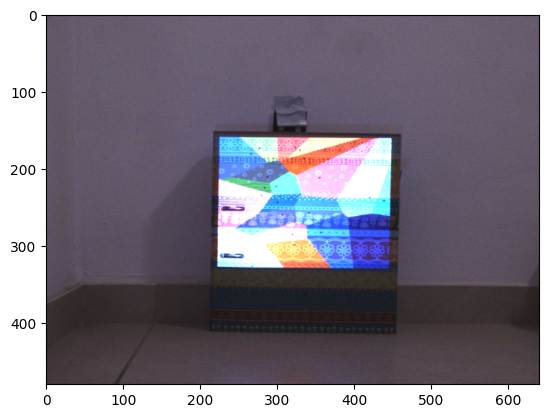

In [13]:
plt.imshow(real_seen)

In [14]:
image_to_project_tensor = torch.from_numpy(image_to_project_resized).permute(2,0,1).unsqueeze(0).float().to(device) / 255.0

In [15]:
image_to_project_tensor_double = image_to_project_tensor.double()

In [16]:
import plotly.express as px

In [17]:
import matplotlib.pyplot as plt

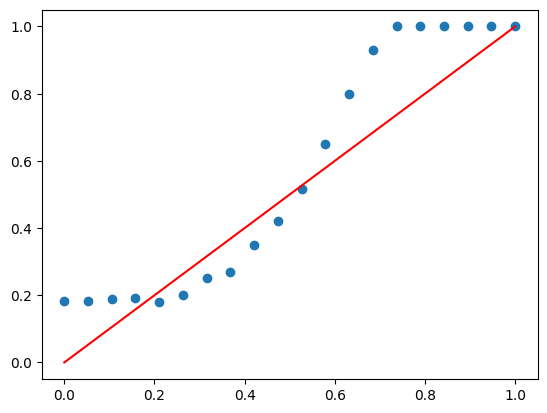

In [18]:
plt.scatter(augmentor_model.x_data_tensor[0,100,100],augmentor_model.y_data_tensor[0,100,100])
# add x = y graph
plt.plot([0,1],[0,1], color='red')


In [19]:
augmentor_model =augmentor_model.to('cpu')

In [20]:
augmentor_model.V[100,100]

tensor([[ 1.1098,  0.2173, -0.0055],
        [ 0.1766,  1.0832,  0.6275],
        [ 0.0715,  0.2168,  1.1860]])

In [21]:
p = augmentor_model(image_to_project_tensor, mode="color_only").clamp(0.0, 1.0)
p_np = (p.cpu().detach().squeeze(0).permute(1,2,0).numpy() * 255.0).astype(np.uint8)
p_np_w = cv2.warpPerspective(p_np.astype(np.uint8), inv_h, (base_frame.shape[1], base_frame.shape[0]))
mask_pw = cv2.warpPerspective(image_to_project_mask, inv_h, (base_frame.shape[1], base_frame.shape[0]))


p_full = augmentor_model(image_to_project_tensor, mode="full").clamp(0.0, 1.0)
p_np_full = (p_full.cpu().detach().squeeze(0).permute(1,2,0).numpy() * 255.0).astype(np.uint8)
p_np_w_full = cv2.warpPerspective(p_np_full.astype(np.uint8), inv_h, (base_frame.shape[1], base_frame.shape[0]))
mask_pw_full = cv2.warpPerspective(image_to_project_mask, inv_h, (base_frame.shape[1], base_frame.shape[0]))

In [22]:
p = augmentor_model(image_to_project_tensor, mode="color_only")

In [23]:
(p > 1).sum() / p.flatten().shape[0]

tensor(0.4378)

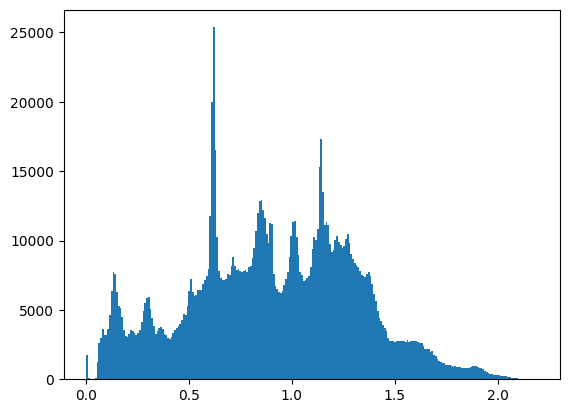

In [24]:
h =plt.hist(p.numpy().flatten(), bins=256)

In [25]:
self = augmentor_model
input_image  = image_to_project_tensor

In [26]:
image_to_project.shape

(960, 960, 3)

In [27]:
augmentor_model

UltraOptimizedProjectorCompensation5()

In [28]:
input_image.shape

torch.Size([1, 3, 608, 720])

In [29]:
self.x_data_tensor.shape

torch.Size([3, 608, 720, 20])

# Optimization Analysis for Interpolation Loop

Based on the transfer function analysis, we can identify several optimization opportunities in the interpolation process (cell 18, lines 20-40).

In [30]:
cap_unwarp = system.cap_and_uwarp()

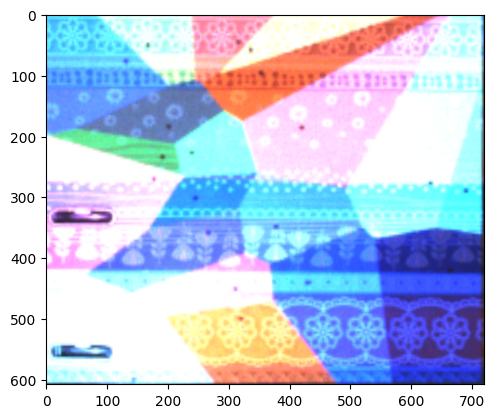

In [31]:
plt.imshow(cap_unwarp)

In [32]:
base_frame_planted = base_frame.copy()
mask_indices = np.where(mask_pw[:,:,0] > 0)
base_frame_planted[mask_indices] = p_np_w[mask_indices]

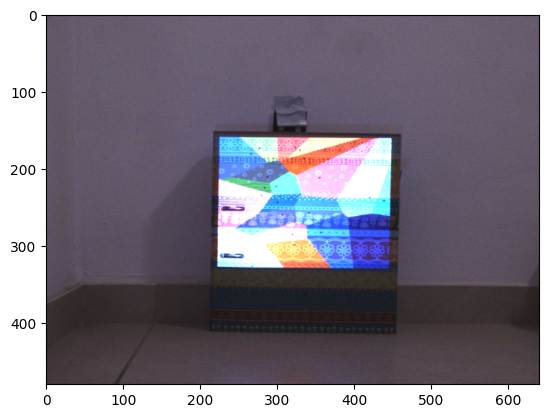

In [33]:
plt.imshow(real_seen)

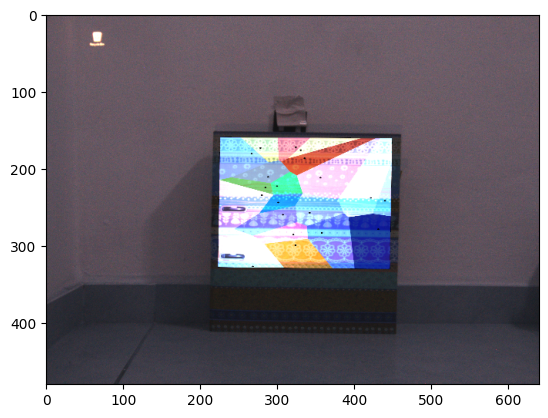

In [34]:
plt.imshow(base_frame_planted)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


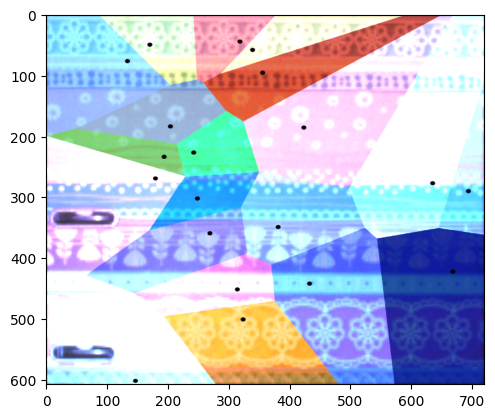

In [35]:
plt.imshow(p.squeeze(0).permute(1,2,0).cpu().detach().numpy())

In [36]:
import torch
import pickle
import sys
sys.path.append('C:/git/CAPAA/src/python')
import models


In [37]:
with open(r"C:\Users\danny\Downloads\pcnet_model.pkl", 'rb') as f:
    pcnet = pickle.load(f)

In [38]:

# plt.imshow(color_pattern_tensor.squeeze(0).permute(1,2,0).cpu().detach().numpy())

In [39]:
base_frame_tensor = torch.from_numpy(base_frame).permute(2,0,1).unsqueeze(0).float().to(device) / 255.0

In [40]:

color_pattern = system.get_placed_image(image_to_project)# cv2.resize(image_to_project, (1920,1080)))

color_pattern_tensor = torch.from_numpy(color_pattern).permute(2,0,1).unsqueeze(0).float().to(device) / 255.0

In [41]:
width_margin = 430#(1920 - 1080) //2

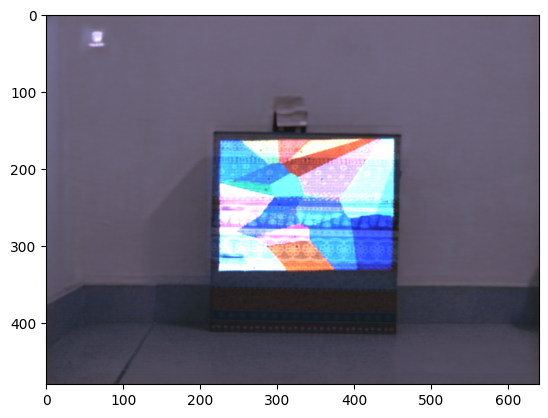

In [42]:
pcnet_output = pcnet(x=color_pattern_tensor[:,:,:,width_margin:-1*width_margin] , s= base_frame_tensor)
pcnet_output_np = pcnet_output.squeeze(0).permute(1,2,0).cpu().detach().numpy()
plt.imshow(pcnet_output_np)


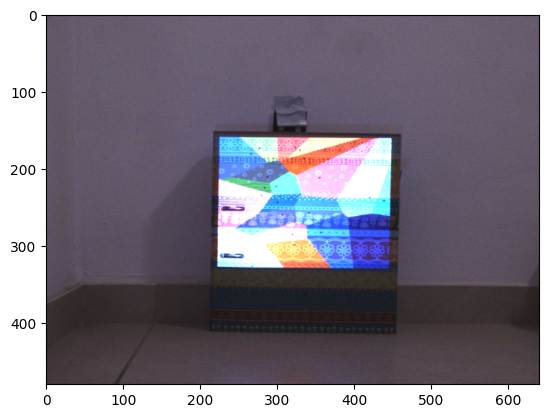

In [43]:
plt.imshow(real_seen)

In [44]:
data['width']

720

In [45]:
data['height']

608

In [46]:
pcnet_unwarp = cv2.warpPerspective(pcnet_output_np, system.H, (system.img_non_zero_section.shape[1], system.img_non_zero_section.shape[0]))
cpcnet_unwarp_np = (pcnet_unwarp * 255).astype(np.uint8)


base_frame_unwarped = cv2.warpPerspective(base_frame,  system.H, (system.img_non_zero_section.shape[1], system.img_non_zero_section.shape[0]))


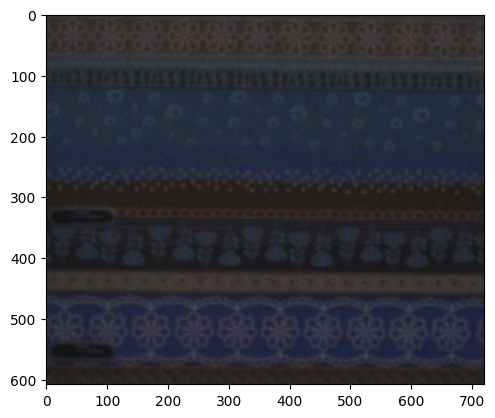

In [47]:
plt.imshow(base_frame_unwarped)

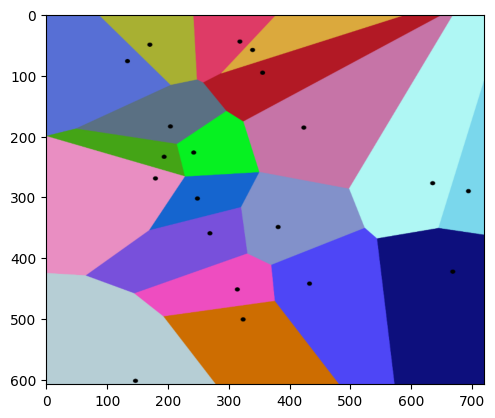

In [48]:
plt.imshow(image_to_project_resized)

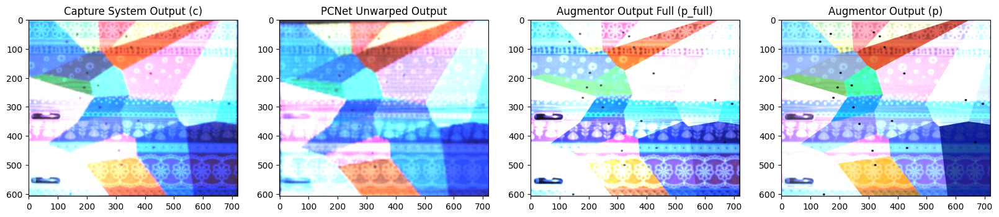

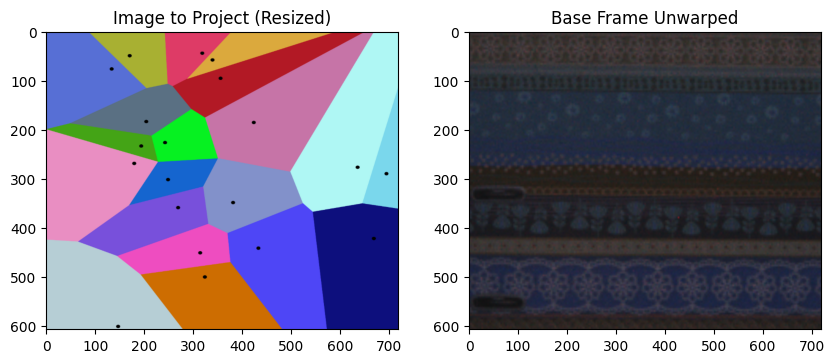

In [49]:
# plot c, cpcnet_unwarp_np, p_np_full and p_np side by side
plt.figure(figsize=(20,5))
plt.subplot(1,4,1)
plt.imshow(c)
plt.title('Capture System Output (c)')
plt.subplot(1,4,2)
plt.imshow(cpcnet_unwarp_np)
plt.title('PCNet Unwarped Output')
plt.subplot(1,4,3)
plt.imshow(p_np_full)
plt.title('Augmentor Output Full (p_full)')
plt.subplot(1,4,4)
plt.imshow(p_np)
plt.title('Augmentor Output (p)')
plt.show()


# plt image_to_project_resized and base_frame_unwarped side by side
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(image_to_project_resized)
plt.title('Image to Project (Resized)')
plt.subplot(1,2,2)
plt.imshow(base_frame_unwarped)
plt.title('Base Frame Unwarped')
plt.show()


In [50]:
rmse_pcnet = np.sqrt(((cpcnet_unwarp_np.astype(float) - cap_unwarp.astype(float)) ** 2).mean())

In [51]:
rmse_our = np.sqrt(((p_np.astype(float) - c.astype(float)) ** 2).mean())

In [52]:
rmse_our_full = np.sqrt(((p_np_full.astype(float) - c.astype(float)) ** 2).mean())

In [53]:
print(f'RMSE PCNet: {rmse_pcnet}')
print(f'RMSE Our Full: {rmse_our_full}')
print(f'RMSE Our: {rmse_our}')

RMSE PCNet: 41.5187063352817
RMSE Our Full: 36.06316995561825
RMSE Our: 30.80128498318694


In [54]:
# plt.imshow(p_v_reshaped.permute(1,2,0).cpu().numpy() / p_v_reshaped.max())

In [55]:
print(rmse_our)

30.80128498318694


In [56]:
print(rmse_pcnet)

41.5187063352817


Generating Per-Channel RMSE Heatmaps...


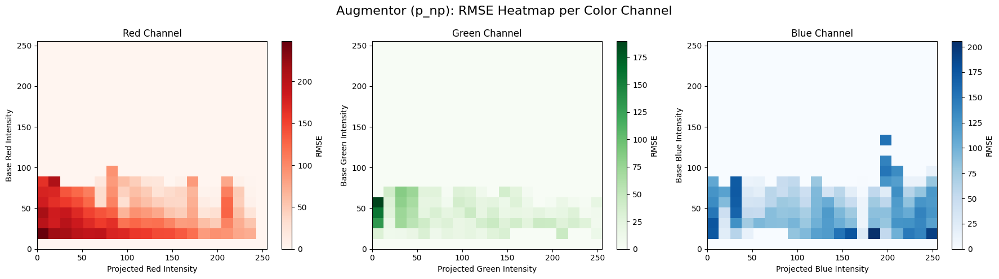

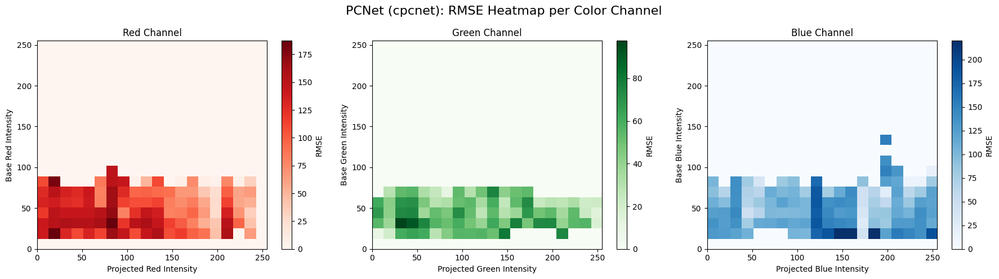

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def analyze_and_plot_heatmap_channels(base_img, proj_img, pred_img, truth_img, title_prefix, bins=32):
    # Ensure all images are RGB for correct channel comparison
    # base_img is typically BGR from OpenCV source
    if base_img.shape[-1] == 3:
        # Assuming base_img (base_frame_unwarped) is BGR as per earlier cells
        base_img = cv2.cvtColor(base_img, cv2.COLOR_BGR2RGB)
    
    # truth_img (c) is likely BGR from CaptureSystem
    if truth_img.shape[-1] == 3:
        truth_img = cv2.cvtColor(truth_img, cv2.COLOR_BGR2RGB)
        
    # proj_img and pred_img are expected to be RGB based on previous cells
    # (image_to_project_resized and p_np/cpcnet_out)

    # Ensure standard casting to float
    base_img = base_img.astype(float)
    proj_img = proj_img.astype(float)
    pred_img = pred_img.astype(float)
    truth_img = truth_img.astype(float)
    
    # Resize to match truth_img dimensions
    h, w = truth_img.shape[:2]
    if base_img.shape[:2] != (h, w):
        base_img = cv2.resize(base_img, (w, h))
    if proj_img.shape[:2] != (h, w):
        proj_img = cv2.resize(proj_img, (w, h))
    if pred_img.shape[:2] != (h, w):
        pred_img = cv2.resize(pred_img, (w, h))

    channel_names = ['Red', 'Green', 'Blue']
    # Use appropriate colormaps for each channel
    cmaps = ['Reds', 'Greens', 'Blues']

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f'{title_prefix}: RMSE Heatmap per Color Channel', fontsize=16)

    for i in range(3):
        # Flatten specific channel
        base_flat = base_img[:, :, i].flatten()
        proj_flat = proj_img[:, :, i].flatten()
        pred_flat = pred_img[:, :, i].flatten()
        truth_flat = truth_img[:, :, i].flatten()
        
        # Squared Error for this channel
        sq_error = (pred_flat - truth_flat) ** 2
        
        # Determine bins
        base_idxs = np.clip((base_flat / 255.99) * bins, 0, bins-1).astype(int)
        proj_idxs = np.clip((proj_flat / 255.99) * bins, 0, bins-1).astype(int)
        
        # Accumulate
        accum_sq_error = np.zeros((bins, bins))
        counts = np.zeros((bins, bins))
        flat_indices = base_idxs * bins + proj_idxs
        
        np.add.at(accum_sq_error.ravel(), flat_indices, sq_error)
        np.add.at(counts.ravel(), flat_indices, 1)
        
        # Compute RMSE
        rmse_map = np.zeros((bins, bins))
        valid_mask = counts > 0
        rmse_map[valid_mask] = np.sqrt(accum_sq_error[valid_mask] / counts[valid_mask])
        
        # Plot
        im = axes[i].imshow(rmse_map, origin='lower', extent=[0, 255, 0, 255], cmap=cmaps[i], aspect='auto')
        axes[i].set_title(f'{channel_names[i]} Channel')
        axes[i].set_xlabel(f'Projected {channel_names[i]} Intensity')
        axes[i].set_ylabel(f'Base {channel_names[i]} Intensity')
        fig.colorbar(im, ax=axes[i], label='RMSE')

    plt.tight_layout()
    plt.show()

print("Generating Per-Channel RMSE Heatmaps...")
analyze_and_plot_heatmap_channels(base_frame_unwarped, image_to_project_resized, p_np, c, "Augmentor (p_np)", bins=20)
analyze_and_plot_heatmap_channels(base_frame_unwarped, image_to_project_resized, cpcnet_unwarp_np, c, "PCNet (cpcnet)", bins=20)

Generating Spatial Error and Scatter Plots...


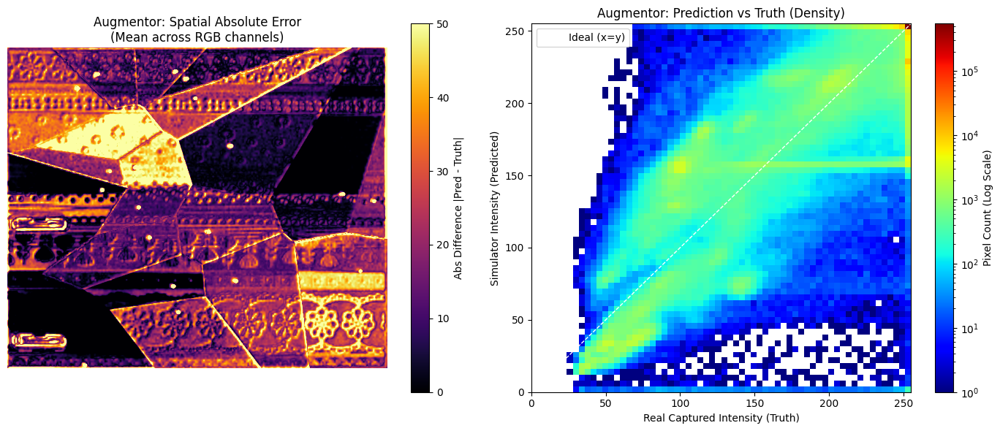

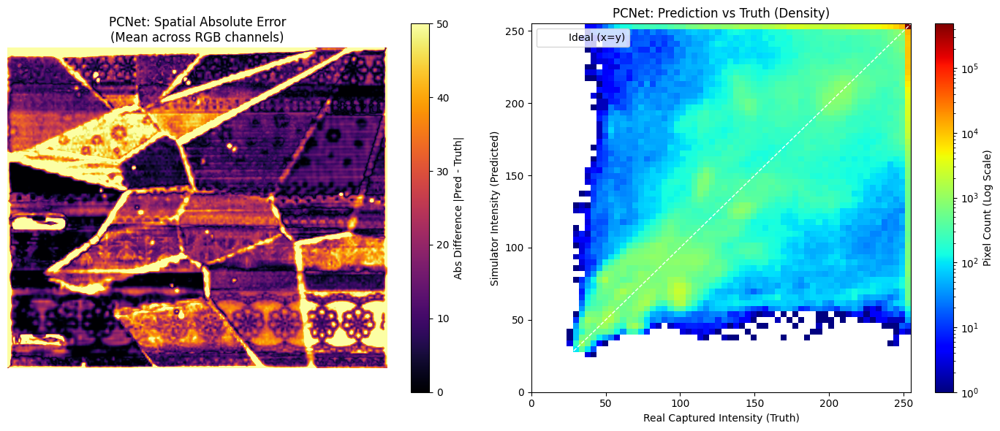

In [58]:
from matplotlib.colors import LogNorm

def visualize_spatial_and_scatter(pred_img, truth_img, title_prefix):
    # 1. Prepare Data
    # Convert to RGB if needed (assuming input might be BGR from cv2)
    # Note: If inputs are already RGB (like p_np/cpcnet_unwarp_np often are in this notebook), 
    # we assume they match. 'c' is usually BGR from cv2.
    # Let's standardize to RGB for display.
    if pred_img.shape[-1] == 3: 
        # Heuristic: if valid OpenCV image, usually BGR. 
        # But p_np came from Permute(1,2,0) which is likely RGB if tensor was RGB.
        # Let's just treat them as consistent numerical arrays for difference calculation.
        pass

    # Resize prediction to match truth
    h, w = truth_img.shape[:2]
    if pred_img.shape[:2] != (h, w):
        pred_img = cv2.resize(pred_img, (w, h))

    # Convert to float for calc
    P = pred_img.astype(float)
    T = truth_img.astype(float)

    # 2. Spatial Error (Absolute Difference), averaged across channels
    # Shape: (H, W)
    diff_map = np.mean(np.abs(P - T), axis=2)

    # 3. Scatter Data (Flattened)
    # Sample a subset of pixels to speed up plotting if image is huge, 
    # or use hist2d for efficiency on all pixels.
    P_flat = P.flatten()
    T_flat = T.flatten()

    # Create Figure
    fig = plt.figure(figsize=(14, 6))
    
    # --- Subplot 1: Spatial Error Map ---
    ax1 = plt.subplot(1, 2, 1)
    im1 = ax1.imshow(diff_map, cmap='inferno', vmin=0, vmax=50) # Vmax capped at 50 to see smaller errors
    ax1.set_title(f"{title_prefix}: Spatial Absolute Error\n(Mean across RGB channels)")
    ax1.axis('off')
    fig.colorbar(im1, ax=ax1, label='Abs Difference |Pred - Truth|')

    # --- Subplot 2: Prediction vs Truth Density ---
    ax2 = plt.subplot(1, 2, 2)
    
    # Use hist2d for a density heatmap of scatter points
    # X axis: Truth, Y axis: Prediction
    counts, xedges, yedges, im2 = ax2.hist2d(T_flat, P_flat, bins=64, range=[[0, 255], [0, 255]], cmap='jet', norm=LogNorm())
    
    # Plot ideal diagonal line
    ax2.plot([0, 255], [0, 255], 'w--', linewidth=1, label='Ideal (x=y)')
    ax2.legend()
    ax2.set_title(f"{title_prefix}: Prediction vs Truth (Density)")
    ax2.set_xlabel("Real Captured Intensity (Truth)")
    ax2.set_ylabel("Simulator Intensity (Predicted)")
    fig.colorbar(im2, ax=ax2, label='Pixel Count (Log Scale)')

    plt.tight_layout()
    plt.show()

print("Generating Spatial Error and Scatter Plots...")
visualize_spatial_and_scatter(p_np, c, "Augmentor")
visualize_spatial_and_scatter(cpcnet_unwarp_np, c, "PCNet")

Generating Error Distribution and Bias Analysis...


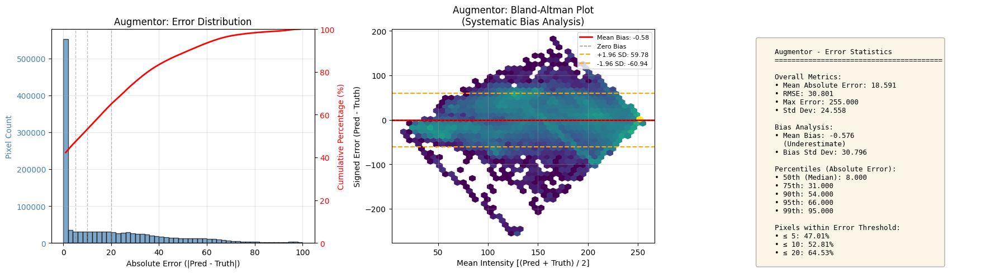

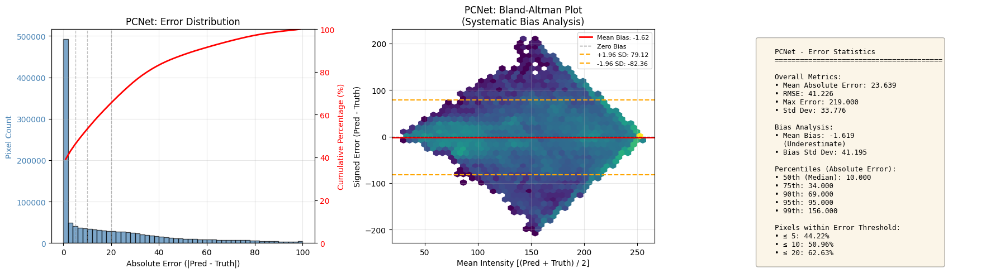

In [59]:
def visualize_error_distribution_and_bias(pred_img, truth_img, title_prefix):
    """
    Visualize error distribution and systematic bias using:
    1. Error histogram with cumulative distribution
    2. Bland-Altman plot for bias analysis
    """
    # Resize and convert to float
    h, w = truth_img.shape[:2]
    if pred_img.shape[:2] != (h, w):
        pred_img = cv2.resize(pred_img, (w, h))
    
    P = pred_img.astype(float)
    T = truth_img.astype(float)
    
    # Flatten all channels
    P_flat = P.flatten()
    T_flat = T.flatten()
    
    # Calculate errors
    abs_error = np.abs(P_flat - T_flat)
    signed_error = P_flat - T_flat  # Positive = overestimate, Negative = underestimate
    mean_intensity = (P_flat + T_flat) / 2
    
    # Create figure
    fig = plt.figure(figsize=(18, 5))
    
    # --- Subplot 1: Error Histogram with Cumulative Distribution ---
    ax1 = plt.subplot(1, 3, 1)
    
    # Histogram
    n, bins, patches = ax1.hist(abs_error, bins=50, range=(0, 100), 
                                  color='steelblue', alpha=0.7, edgecolor='black', label='Error Frequency')
    ax1.set_xlabel('Absolute Error (|Pred - Truth|)')
    ax1.set_ylabel('Pixel Count', color='steelblue')
    ax1.tick_params(axis='y', labelcolor='steelblue')
    ax1.set_title(f'{title_prefix}: Error Distribution')
    ax1.grid(alpha=0.3)
    
    # Cumulative distribution on secondary axis
    ax1_twin = ax1.twinx()
    cumulative = np.cumsum(n) / np.sum(n) * 100
    ax1_twin.plot(bins[:-1] + np.diff(bins)/2, cumulative, 'r-', linewidth=2, label='Cumulative %')
    ax1_twin.set_ylabel('Cumulative Percentage (%)', color='red')
    ax1_twin.tick_params(axis='y', labelcolor='red')
    ax1_twin.set_ylim(0, 100)
    
    # Add reference lines for common thresholds
    for threshold in [5, 10, 20]:
        if threshold < bins[-1]:
            ax1.axvline(threshold, color='gray', linestyle='--', alpha=0.5, linewidth=1)
    
    # --- Subplot 2: Bland-Altman Plot ---
    ax2 = plt.subplot(1, 3, 2)
    
    # Sample points for plotting (full dataset might be too dense)
    sample_size = min(50000, len(mean_intensity))
    indices = np.random.choice(len(mean_intensity), sample_size, replace=False)
    
    ax2.hexbin(mean_intensity[indices], signed_error[indices], 
               gridsize=40, cmap='viridis', mincnt=1, bins='log')
    
    # Mean bias line
    mean_bias = np.mean(signed_error)
    ax2.axhline(mean_bias, color='red', linestyle='-', linewidth=2, label=f'Mean Bias: {mean_bias:.2f}')
    ax2.axhline(0, color='black', linestyle='--', linewidth=1, alpha=0.5, label='Zero Bias')
    
    # +/- 1.96 SD lines (95% limits of agreement)
    std_bias = np.std(signed_error)
    ax2.axhline(mean_bias + 1.96*std_bias, color='orange', linestyle='--', linewidth=1.5, 
                label=f'+1.96 SD: {mean_bias + 1.96*std_bias:.2f}')
    ax2.axhline(mean_bias - 1.96*std_bias, color='orange', linestyle='--', linewidth=1.5,
                label=f'-1.96 SD: {mean_bias - 1.96*std_bias:.2f}')
    
    ax2.set_xlabel('Mean Intensity [(Pred + Truth) / 2]')
    ax2.set_ylabel('Signed Error (Pred - Truth)')
    ax2.set_title(f'{title_prefix}: Bland-Altman Plot\n(Systematic Bias Analysis)')
    ax2.legend(loc='best', fontsize=8)
    ax2.grid(alpha=0.3)
    
    # --- Subplot 3: Error Statistics Summary ---
    ax3 = plt.subplot(1, 3, 3)
    ax3.axis('off')
    
    # Calculate statistics
    stats_text = f"""
    {title_prefix} - Error Statistics
    {'='*40}
    
    Overall Metrics:
    • Mean Absolute Error: {np.mean(abs_error):.3f}
    • RMSE: {np.sqrt(np.mean(abs_error**2)):.3f}
    • Max Error: {np.max(abs_error):.3f}
    • Std Dev: {np.std(abs_error):.3f}
    
    Bias Analysis:
    • Mean Bias: {mean_bias:.3f}
      {'(Overestimate)' if mean_bias > 0 else '(Underestimate)'}
    • Bias Std Dev: {std_bias:.3f}
    
    Percentiles (Absolute Error):
    • 50th (Median): {np.percentile(abs_error, 50):.3f}
    • 75th: {np.percentile(abs_error, 75):.3f}
    • 90th: {np.percentile(abs_error, 90):.3f}
    • 95th: {np.percentile(abs_error, 95):.3f}
    • 99th: {np.percentile(abs_error, 99):.3f}
    
    Pixels within Error Threshold:
    • ≤ 5: {np.sum(abs_error <= 5)/len(abs_error)*100:.2f}%
    • ≤ 10: {np.sum(abs_error <= 10)/len(abs_error)*100:.2f}%
    • ≤ 20: {np.sum(abs_error <= 20)/len(abs_error)*100:.2f}%
    """
    
    ax3.text(0.1, 0.95, stats_text, transform=ax3.transAxes, 
             fontsize=9, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))
    
    plt.tight_layout()
    plt.show()

print("Generating Error Distribution and Bias Analysis...")
visualize_error_distribution_and_bias(p_np, c, "Augmentor")
visualize_error_distribution_and_bias(cpcnet_unwarp_np, c, "PCNet")

Generating Per-Channel Spatial Error Maps...


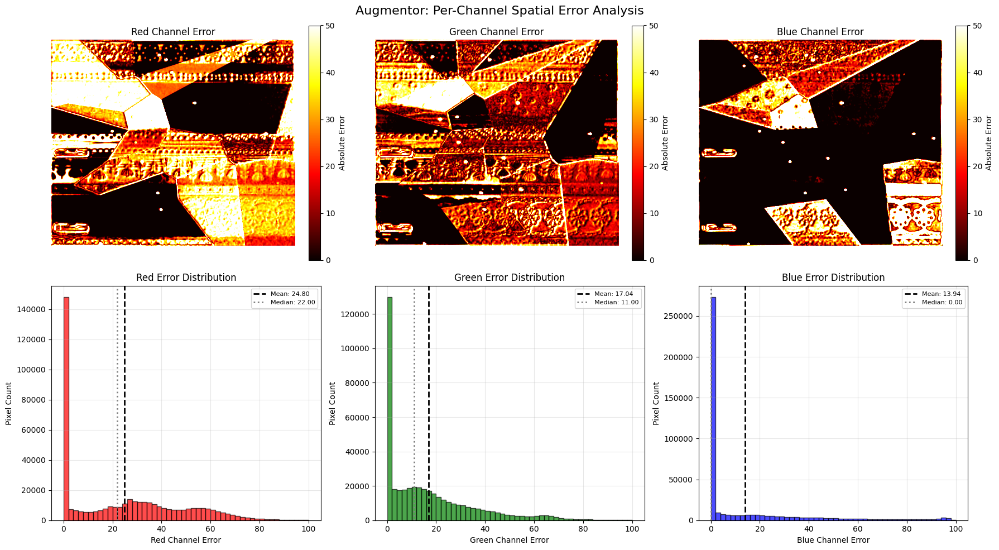

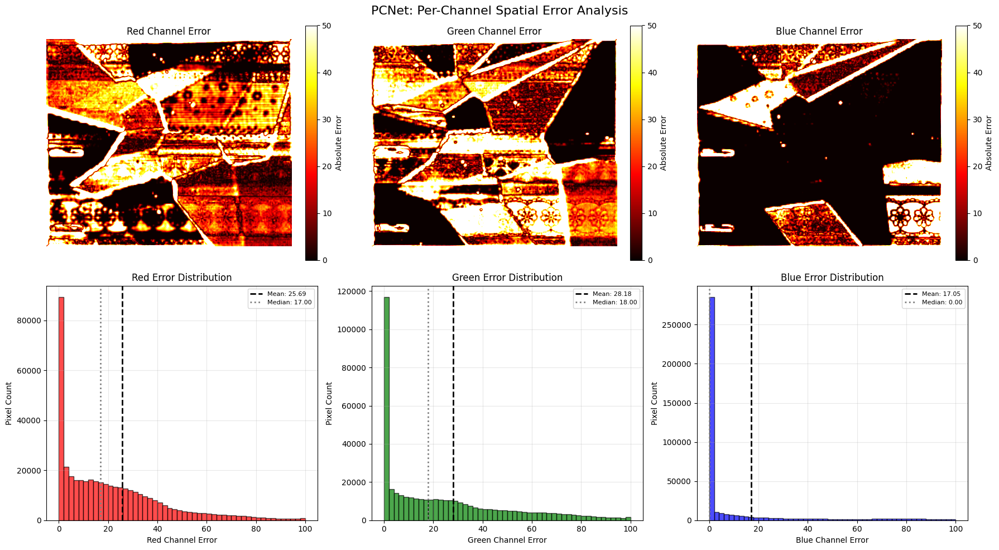

In [60]:
def visualize_per_channel_spatial_errors(pred_img, truth_img, title_prefix):
    """
    Show spatial error maps for each color channel independently
    to identify channel-specific issues
    """
    # Resize and convert
    h, w = truth_img.shape[:2]
    if pred_img.shape[:2] != (h, w):
        pred_img = cv2.resize(pred_img, (w, h))
    
    P = pred_img.astype(float)
    T = truth_img.astype(float)
    
    # Calculate per-channel absolute errors
    channel_errors = np.abs(P - T)
    channel_names = ['Red', 'Green', 'Blue']
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle(f'{title_prefix}: Per-Channel Spatial Error Analysis', fontsize=16)
    
    for i in range(3):
        # Row 1: Spatial error map
        ax_map = axes[0, i]
        im = ax_map.imshow(channel_errors[:, :, i], cmap='hot', vmin=0, vmax=50)
        ax_map.set_title(f'{channel_names[i]} Channel Error')
        ax_map.axis('off')
        fig.colorbar(im, ax=ax_map, label='Absolute Error', fraction=0.046)
        
        # Row 2: Error histogram
        ax_hist = axes[1, i]
        error_flat = channel_errors[:, :, i].flatten()
        
        ax_hist.hist(error_flat, bins=50, range=(0, 100), color=['red', 'green', 'blue'][i], 
                     alpha=0.7, edgecolor='black')
        ax_hist.set_xlabel(f'{channel_names[i]} Channel Error')
        ax_hist.set_ylabel('Pixel Count')
        ax_hist.set_title(f'{channel_names[i]} Error Distribution')
        ax_hist.grid(alpha=0.3)
        
        # Add statistics text
        mean_err = np.mean(error_flat)
        median_err = np.median(error_flat)
        std_err = np.std(error_flat)
        ax_hist.axvline(mean_err, color='black', linestyle='--', linewidth=2, label=f'Mean: {mean_err:.2f}')
        ax_hist.axvline(median_err, color='gray', linestyle=':', linewidth=2, label=f'Median: {median_err:.2f}')
        ax_hist.legend(fontsize=8)
    
    plt.tight_layout()
    plt.show()

print("Generating Per-Channel Spatial Error Maps...")
visualize_per_channel_spatial_errors(p_np, c, "Augmentor")
visualize_per_channel_spatial_errors(cpcnet_unwarp_np, c, "PCNet")

In [61]:
# Investigate the RMSE discrepancy
print("=" * 60)
print("Debugging RMSE Calculation Differences")
print("=" * 60)

# Check dimensions
print(f"\nDimensions:")
print(f"  c (ground truth):      {c.shape}")
print(f"  p_np (Augmentor):      {p_np.shape}")
print(f"  cpcnet_unwarp_np:      {cpcnet_unwarp_np.shape}")

# Check if there are NaN or inf values
print(f"\nData Quality:")
print(f"  c has NaN:             {np.isnan(c).any()}")
print(f"  p_np has NaN:          {np.isnan(p_np).any()}")
print(f"  cpcnet has NaN:        {np.isnan(cpcnet_unwarp_np).any()}")

# Calculate RMSE with explicit dtype handling
print(f"\nOriginal RMSE values:")
print(f"  rmse_our (printed):    {rmse_our}")
print(f"  rmse_pcnet (printed):  {rmse_pcnet}")

# Recalculate with proper casting
c_float = c.astype(np.float64)
p_np_float = p_np.astype(np.float64)
cpcnet_float = cpcnet_unwarp_np.astype(np.float64)

rmse_augmentor_v2 = np.sqrt(np.mean((p_np_float - c_float) ** 2))
rmse_pcnet_v2 = np.sqrt(np.mean((cpcnet_float - c_float) ** 2))

print(f"\nRecalculated RMSE (float64):")
print(f"  Augmentor RMSE:        {rmse_augmentor_v2:.4f}")
print(f"  PCNet RMSE:            {rmse_pcnet_v2:.4f}")

# Check data ranges
print(f"\nData Ranges:")
print(f"  c:                     [{c.min():.2f}, {c.max():.2f}]")
print(f"  p_np:                  [{p_np.min():.2f}, {p_np.max():.2f}]")
print(f"  cpcnet_unwarp_np:      [{cpcnet_unwarp_np.min():.2f}, {cpcnet_unwarp_np.max():.2f}]")

# Check mean brightness
print(f"\nMean Brightness:")
print(f"  c (truth):             {c.mean():.2f}")
print(f"  p_np (Augmentor):      {p_np.mean():.2f}")
print(f"  cpcnet (PCNet):        {cpcnet_unwarp_np.mean():.2f}")

# Calculate per-channel RMSE
print(f"\nPer-Channel RMSE:")
for i, color in enumerate(['R', 'G', 'B']):
    rmse_aug_ch = np.sqrt(np.mean((p_np_float[:,:,i] - c_float[:,:,i]) ** 2))
    rmse_pcn_ch = np.sqrt(np.mean((cpcnet_float[:,:,i] - c_float[:,:,i]) ** 2))
    print(f"  {color} - Augmentor: {rmse_aug_ch:.4f}, PCNet: {rmse_pcn_ch:.4f}")

print("\n" + "=" * 60)

Debugging RMSE Calculation Differences

Dimensions:
  c (ground truth):      (608, 720, 3)
  p_np (Augmentor):      (608, 720, 3)
  cpcnet_unwarp_np:      (608, 720, 3)

Data Quality:
  c has NaN:             False
  p_np has NaN:          False
  cpcnet has NaN:        False

Original RMSE values:
  rmse_our (printed):    30.80128498318694
  rmse_pcnet (printed):  41.5187063352817

Recalculated RMSE (float64):
  Augmentor RMSE:        30.8013
  PCNet RMSE:            41.2264

Data Ranges:
  c:                     [27.00, 255.00]
  p_np:                  [0.00, 255.00]
  cpcnet_unwarp_np:      [27.00, 255.00]

Mean Brightness:
  c (truth):             199.43
  p_np (Augmentor):      198.85
  cpcnet (PCNet):        197.81

Per-Channel RMSE:
  R - Augmentor: 35.3200, PCNet: 40.7828
  G - Augmentor: 26.4281, PCNet: 43.5974
  B - Augmentor: 30.0035, PCNet: 39.1776



In [62]:
# Multi-Image Comparison: Ours vs CAPAA

# This section projects multiple test images (Voronoi patterns, full color images, gradients) 
# and compares simulation accuracy between our approach and CAPAA.

In [63]:
# ============================================================================
# Generate Test Images: Voronoi patterns, full color images, gradients
# ============================================================================
from scipy.spatial import Voronoi
import numpy as np
import cv2

def generate_voronoi_image(width, height, n_points=50, seed=None):
    """Generate a colorful Voronoi pattern image."""
    if seed is not None:
        np.random.seed(seed)
    
    # Generate random points
    points = np.random.rand(n_points, 2)
    points[:, 0] *= width
    points[:, 1] *= height
    
    # Create image
    img = np.zeros((height, width, 3), dtype=np.float32)
    
    # Generate random colors for each cell
    colors = np.random.rand(n_points, 3).astype(np.float32)
    
    # For each pixel, find closest point
    y_coords, x_coords = np.meshgrid(np.arange(height), np.arange(width), indexing='ij')
    
    for i in range(n_points):
        dist = np.sqrt((x_coords - points[i, 0])**2 + (y_coords - points[i, 1])**2)
        if i == 0:
            min_dist = dist
            closest = np.zeros((height, width), dtype=int)
        else:
            mask = dist < min_dist
            closest[mask] = i
            min_dist = np.minimum(min_dist, dist)
    
    for i in range(n_points):
        img[closest == i] = colors[i]
    
    return img

def generate_gradient_image(width, height, direction='horizontal'):
    """Generate gradient images."""
    if direction == 'horizontal':
        grad = np.linspace(0, 1, width).reshape(1, -1, 1)
        img = np.tile(grad, (height, 1, 3))
    elif direction == 'vertical':
        grad = np.linspace(0, 1, height).reshape(-1, 1, 1)
        img = np.tile(grad, (1, width, 3))
    elif direction == 'radial':
        y, x = np.meshgrid(np.linspace(-1, 1, height), np.linspace(-1, 1, width), indexing='ij')
        r = np.sqrt(x**2 + y**2)
        r = 1 - np.clip(r, 0, 1)
        img = np.stack([r, r, r], axis=-1)
    elif direction == 'rgb_horizontal':
        # RGB gradient
        img = np.zeros((height, width, 3), dtype=np.float32)
        img[:, :, 0] = np.linspace(0, 1, width).reshape(1, -1)  # Red
        img[:, :, 1] = np.linspace(0, 1, height).reshape(-1, 1)  # Green
        img[:, :, 2] = 1 - np.linspace(0, 1, width).reshape(1, -1)  # Blue
    return img.astype(np.float32)

def generate_color_bars(width, height):
    """Generate color bars test pattern."""
    img = np.zeros((height, width, 3), dtype=np.float32)
    colors = [
        [1, 1, 1],  # White
        [1, 1, 0],  # Yellow
        [0, 1, 1],  # Cyan
        [0, 1, 0],  # Green
        [1, 0, 1],  # Magenta
        [1, 0, 0],  # Red
        [0, 0, 1],  # Blue
        [0, 0, 0],  # Black
    ]
    bar_width = width // len(colors)
    for i, color in enumerate(colors):
        img[:, i*bar_width:(i+1)*bar_width] = color
    return img

# Generate test images
H, W = data['height'], data['width']

test_images = {
    'Voronoi_1': generate_voronoi_image(W, H, n_points=30, seed=42),
    'Voronoi_2': generate_voronoi_image(W, H, n_points=80, seed=123),
    'Voronoi_3': generate_voronoi_image(W, H, n_points=150, seed=456),
    'Gradient_H': generate_gradient_image(W, H, 'horizontal'),
    'Gradient_V': generate_gradient_image(W, H, 'vertical'),
    'Gradient_Radial': generate_gradient_image(W, H, 'radial'),
    'Gradient_RGB': generate_gradient_image(W, H, 'rgb_horizontal'),
    'Color_Bars': generate_color_bars(W, H),
}

# Add some real images if available
real_image_paths = [
    r"results/best_patch_ensamble_classifier_16x16_9_2025-12-21_07_52.png",
    r"results/best_patch_str_16x16_8_2025-12-20_18_20.png",
    r"results/best_patch_16x16_3_2025-12-15_14_25.png",
]

for i, path in enumerate(real_image_paths):
    try:
        img = cv2.imread(path)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (W, H)).astype(np.float32) / 255.0
            test_images[f'RealImage_{i+1}'] = img
    except Exception as e:
        print(f"Could not load {path}: {e}")

print(f"Generated {len(test_images)} test images:")
for name in test_images.keys():
    print(f"  - {name}: {test_images[name].shape}")

Generated 11 test images:
  - Voronoi_1: (608, 720, 3)
  - Voronoi_2: (608, 720, 3)
  - Voronoi_3: (608, 720, 3)
  - Gradient_H: (608, 720, 3)
  - Gradient_V: (608, 720, 3)
  - Gradient_Radial: (608, 720, 3)
  - Gradient_RGB: (608, 720, 3)
  - Color_Bars: (608, 720, 3)
  - RealImage_1: (608, 720, 3)
  - RealImage_2: (608, 720, 3)
  - RealImage_3: (608, 720, 3)


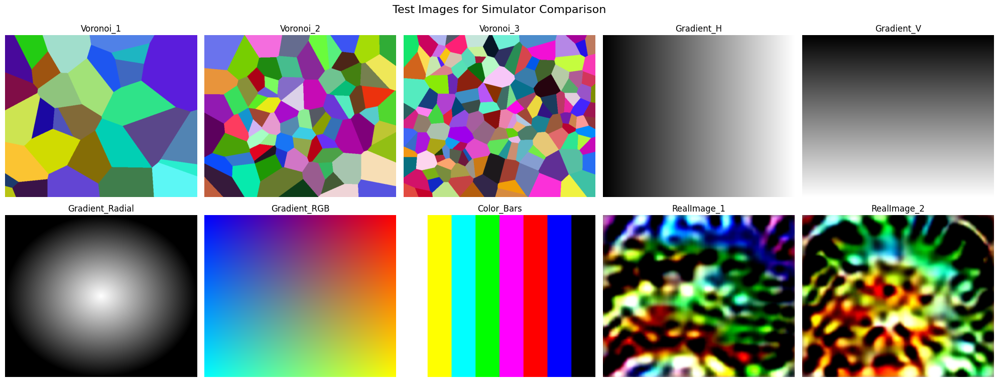

In [64]:
# Visualize test images
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

for idx, (name, img) in enumerate(test_images.items()):
    if idx < len(axes):
        axes[idx].imshow(np.clip(img, 0, 1))
        axes[idx].set_title(name)
        axes[idx].axis('off')

# Hide extra axes
for idx in range(len(test_images), len(axes)):
    axes[idx].axis('off')

plt.suptitle('Test Images for Simulator Comparison', fontsize=16)
plt.tight_layout()
plt.show()

In [65]:
# ============================================================================
# Project each image, capture real result, simulate with both methods
# ============================================================================
import time
from tqdm import tqdm

# Width margin used for CAPAA - use the same as defined earlier in notebook
# This should match what was used for pcnet training/calibration

def project_and_capture(system, image, n_captures=5, delay=0.3):
    """Project image and capture the result using system.cap_and_uwarp()."""
    # Project the image (expects uint8)
    system.plot_on_screen((image * 255).astype(np.uint8))
    time.sleep(delay)
    
    # Capture multiple frames and average using cap_and_uwarp
    captures = []
    for _ in range(n_captures):
        cap_unwarp = system.cap_and_uwarp()  # This already unwarps correctly
        captures.append(cap_unwarp)
        time.sleep(0.05)
    
    # Average captures
    avg_capture = np.mean(captures, axis=0).astype(np.uint8)
    
    return avg_capture

def simulate_ours(augmentor, image_tensor):
    """Run our simulator with mode='full' like in cell 21."""
    with torch.no_grad():
        # Use mode="full" and clamp like in cell 21:
        # p_full = augmentor_model(image_to_project_tensor, mode="full").clamp(0.0, 1.0)
        output = augmentor(image_tensor, mode="full").clamp(0.0, 1.0)
    return output

def simulate_capaa(pcnet, color_pattern_tensor, base_frame_tensor, width_margin):
    """Run CAPAA PCNet simulator like in cell 43.
    
    PCNet expects:
    - x: projected image, cropped to remove width_margin from both sides
    - s: scene/base image
    
    Matches: pcnet(x=color_pattern_tensor[:,:,:,width_margin:-1*width_margin] , s= base_frame_tensor)
    """
    with torch.no_grad():
        # Crop x like in cell 43: color_pattern_tensor[:,:,:,width_margin:-1*width_margin]
        x_cropped = color_pattern_tensor[:, :, :, width_margin:-1*width_margin]
        output = pcnet(x=x_cropped, s=base_frame_tensor)
    return output

# Results storage
results = {
    'image_name': [],
    'rmse_ours': [],
    'rmse_capaa': [],
    'mae_ours': [],
    'mae_capaa': [],
    'ssim_ours': [],
    'ssim_capaa': [],
}

# Pre-calculate homography for unwarping CAPAA output
# (CAPAA outputs in camera coordinates, need to unwarp to compare with our approach)
inv_h = np.linalg.inv(system.H)

# For CAPAA: use base_frame_tensor (already defined in cell 40)
# base_frame_tensor = torch.from_numpy(base_frame).permute(2,0,1).unsqueeze(0).float().to(device) / 255.0
print(f"base_frame shape: {base_frame.shape}")
print(f"base_frame_tensor shape: {base_frame_tensor.shape}")

print("\nStarting multi-image comparison...")
print("=" * 70)

base_frame shape: (480, 640, 3)
base_frame_tensor shape: torch.Size([1, 3, 480, 640])

Starting multi-image comparison...


In [66]:
base_cap = project_and_capture(system, np.zeros((H, W, 3), dtype=np.float32))  # Project black to reset

In [67]:
# ============================================================================
# Run comparison for all test images
# ============================================================================
from skimage.metrics import structural_similarity as ssim

captured_images = {}
simulated_ours = {}
simulated_capaa = {}

for name, test_img in tqdm(test_images.items(), desc="Processing images"):
    # =========================================================================
    # 1. Project and capture real result using cap_and_uwarp (like cell 12)
    # =========================================================================
    captured = project_and_capture(system, test_img, n_captures=3, delay=0.4)
    captured_images[name] = captured
    
    # =========================================================================
    # 2. Simulate with OUR approach (like cell 21)
    # =========================================================================
    # Prepare tensor for our approach (expects image in [0,1] range, BCHW format)
    img_tensor = torch.tensor(test_img).permute(2, 0, 1).unsqueeze(0).float().to(device)
    
    # Simulate: p_full = augmentor_model(image_to_project_tensor, mode="full").clamp(0.0, 1.0)
    ours_output = simulate_ours(augmentor_model, img_tensor)
    ours_np = (ours_output.squeeze(0).permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
    simulated_ours[name] = ours_np
    
    # =========================================================================
    # 3. Simulate with CAPAA PCNet (like cells 41-43)
    # =========================================================================
    # Get placed image in projector coordinates (like cell 41)
    # color_pattern = system.get_placed_image(image_to_project)
    color_pattern = system.get_placed_image((test_img * 255).astype(np.uint8))
    color_pattern_tensor = torch.from_numpy(color_pattern).permute(2, 0, 1).unsqueeze(0).float().to(device) / 255.0
    
    # Simulate: pcnet(x=color_pattern_tensor[:,:,:,width_margin:-1*width_margin], s=base_frame_tensor)
    capaa_output = simulate_capaa(pcnet, color_pattern_tensor, base_frame_tensor, width_margin)
    capaa_np = (capaa_output.squeeze(0).permute(1, 2, 0).cpu().numpy() * 255).clip(0, 255).astype(np.uint8)
    
    # Unwarp CAPAA output to match capture coordinates (like cell 47)
    # pcnet_unwarp = cv2.warpPerspective(pcnet_output_np, system.H, ...)
    capaa_np_unwarped = cv2.warpPerspective(capaa_np.astype(np.float32), system.H, 
                                             (ours_np.shape[1], ours_np.shape[0]))
    simulated_capaa[name] = capaa_np_unwarped.astype(np.uint8)
    
    # =========================================================================
    # 4. Calculate metrics
    # =========================================================================
    # captured is already RGB from cap_and_uwarp, convert to float for comparison
    captured_rgb = captured.astype(np.float32)
    ours_np_float = ours_np.astype(np.float32)
    capaa_np_float = capaa_np_unwarped.astype(np.float32)
    
    # RMSE
    rmse_ours = np.sqrt(np.mean((ours_np_float - captured_rgb) ** 2))
    rmse_capaa = np.sqrt(np.mean((capaa_np_float - captured_rgb) ** 2))
    
    # MAE
    mae_ours = np.mean(np.abs(ours_np_float - captured_rgb))
    mae_capaa = np.mean(np.abs(capaa_np_float - captured_rgb))
    
    # SSIM (convert to grayscale)
    gray_ours = cv2.cvtColor(ours_np, cv2.COLOR_RGB2GRAY)
    gray_capaa = cv2.cvtColor(capaa_np_unwarped.astype(np.uint8), cv2.COLOR_RGB2GRAY)
    gray_captured = cv2.cvtColor(captured, cv2.COLOR_RGB2GRAY)
    
    ssim_ours = ssim(gray_ours, gray_captured)
    ssim_capaa = ssim(gray_capaa, gray_captured)
    
    # Store results
    results['image_name'].append(name)
    results['rmse_ours'].append(rmse_ours)
    results['rmse_capaa'].append(rmse_capaa)
    results['mae_ours'].append(mae_ours)
    results['mae_capaa'].append(mae_capaa)
    results['ssim_ours'].append(ssim_ours)
    results['ssim_capaa'].append(ssim_capaa)
    
    print(f"{name}: RMSE(Ours)={rmse_ours:.2f}, RMSE(CAPAA)={rmse_capaa:.2f}, "
          f"SSIM(Ours)={ssim_ours:.3f}, SSIM(CAPAA)={ssim_capaa:.3f}")

# Turn off projection after done
system.plot_on_screen(np.zeros((H, W, 3), dtype=np.uint8))
print("\n" + "=" * 70)
print("All images processed!")

Processing images:   9%|▉         | 1/11 [00:02<00:21,  2.20s/it]

Voronoi_1: RMSE(Ours)=39.00, RMSE(CAPAA)=43.55, SSIM(Ours)=0.701, SSIM(CAPAA)=0.748


Processing images:  18%|█▊        | 2/11 [00:04<00:20,  2.23s/it]

Voronoi_2: RMSE(Ours)=41.50, RMSE(CAPAA)=48.37, SSIM(Ours)=0.667, SSIM(CAPAA)=0.658


Processing images:  27%|██▋       | 3/11 [00:06<00:17,  2.21s/it]

Voronoi_3: RMSE(Ours)=40.96, RMSE(CAPAA)=54.72, SSIM(Ours)=0.628, SSIM(CAPAA)=0.593


Processing images:  36%|███▋      | 4/11 [00:09<00:15,  2.28s/it]

Gradient_H: RMSE(Ours)=44.78, RMSE(CAPAA)=32.38, SSIM(Ours)=0.706, SSIM(CAPAA)=0.882


Processing images:  45%|████▌     | 5/11 [00:11<00:13,  2.21s/it]

Gradient_V: RMSE(Ours)=40.88, RMSE(CAPAA)=32.64, SSIM(Ours)=0.717, SSIM(CAPAA)=0.875


Processing images:  55%|█████▍    | 6/11 [00:13<00:11,  2.22s/it]

Gradient_Radial: RMSE(Ours)=47.52, RMSE(CAPAA)=29.51, SSIM(Ours)=0.615, SSIM(CAPAA)=0.915


Processing images:  64%|██████▎   | 7/11 [00:15<00:08,  2.20s/it]

Gradient_RGB: RMSE(Ours)=39.01, RMSE(CAPAA)=40.18, SSIM(Ours)=0.705, SSIM(CAPAA)=0.795


Processing images:  73%|███████▎  | 8/11 [00:17<00:06,  2.22s/it]

Color_Bars: RMSE(Ours)=32.14, RMSE(CAPAA)=38.92, SSIM(Ours)=0.750, SSIM(CAPAA)=0.818


Processing images:  82%|████████▏ | 9/11 [00:19<00:04,  2.20s/it]

RealImage_1: RMSE(Ours)=40.73, RMSE(CAPAA)=59.53, SSIM(Ours)=0.661, SSIM(CAPAA)=0.636


Processing images:  91%|█████████ | 10/11 [00:22<00:02,  2.23s/it]

RealImage_2: RMSE(Ours)=41.63, RMSE(CAPAA)=62.66, SSIM(Ours)=0.670, SSIM(CAPAA)=0.565


Processing images: 100%|██████████| 11/11 [00:24<00:00,  2.23s/it]

RealImage_3: RMSE(Ours)=38.94, RMSE(CAPAA)=66.16, SSIM(Ours)=0.661, SSIM(CAPAA)=0.561



All images processed!


In [68]:
# ============================================================================
# Create Results DataFrame and Summary Statistics
# ============================================================================
import pandas as pd

df_results = pd.DataFrame(results)

# Calculate summary statistics
print("=" * 70)
print("AGGREGATED RESULTS SUMMARY")
print("=" * 70)

print(f"\n{'Metric':<20} {'Ours (Mean ± Std)':<25} {'CAPAA (Mean ± Std)':<25} {'Winner':<10}")
print("-" * 80)

metrics = [('RMSE', 'rmse', 'lower'), ('MAE', 'mae', 'lower'), ('SSIM', 'ssim', 'higher')]

for metric_name, metric_key, better in metrics:
    ours_mean = df_results[f'{metric_key}_ours'].mean()
    ours_std = df_results[f'{metric_key}_ours'].std()
    capaa_mean = df_results[f'{metric_key}_capaa'].mean()
    capaa_std = df_results[f'{metric_key}_capaa'].std()
    
    if better == 'lower':
        winner = 'Ours' if ours_mean < capaa_mean else 'CAPAA'
    else:
        winner = 'Ours' if ours_mean > capaa_mean else 'CAPAA'
    
    print(f"{metric_name:<20} {ours_mean:>8.3f} ± {ours_std:<8.3f} {capaa_mean:>8.3f} ± {capaa_std:<8.3f}    {winner:<10}")

print("\n" + "-" * 80)

# Win counts per image
ours_wins_rmse = (df_results['rmse_ours'] < df_results['rmse_capaa']).sum()
capaa_wins_rmse = (df_results['rmse_ours'] > df_results['rmse_capaa']).sum()
ties_rmse = (df_results['rmse_ours'] == df_results['rmse_capaa']).sum()

ours_wins_ssim = (df_results['ssim_ours'] > df_results['ssim_capaa']).sum()
capaa_wins_ssim = (df_results['ssim_ours'] < df_results['ssim_capaa']).sum()

print(f"\nPer-image wins (RMSE): Ours={ours_wins_rmse}, CAPAA={capaa_wins_rmse}, Ties={ties_rmse}")
print(f"Per-image wins (SSIM): Ours={ours_wins_ssim}, CAPAA={capaa_wins_ssim}")

print("\n" + "=" * 70)
df_results

AGGREGATED RESULTS SUMMARY

Metric               Ours (Mean ± Std)         CAPAA (Mean ± Std)        Winner    
--------------------------------------------------------------------------------
RMSE                   40.643 ± 3.832      46.238 ± 12.939      Ours      
MAE                    27.414 ± 4.834      27.792 ± 9.243       Ours      
SSIM                    0.680 ± 0.040       0.731 ± 0.134       CAPAA     

--------------------------------------------------------------------------------

Per-image wins (RMSE): Ours=8, CAPAA=3, Ties=0
Per-image wins (SSIM): Ours=5, CAPAA=6



,image_name,rmse_ours,rmse_capaa,mae_ours,mae_capaa,ssim_ours,ssim_capaa
0,Voronoi_1,38.999878,43.545834,24.043640,24.800610,0.700936,0.747548
1,Voronoi_2,41.495350,48.373138,25.912888,28.926186,0.667356,0.657973
2,Voronoi_3,40.960045,54.720848,25.868744,33.838753,0.628019,0.593248
3,Gradient_H,44.776550,32.383167,29.732876,18.138256,0.705525,0.881798
4,Gradient_V,40.881424,32.644039,28.450666,18.917376,0.717112,0.875023
5,Gradient_Radial,47.518200,29.505962,37.327095,19.024734,0.614734,0.915367
6,Gradient_RGB,39.006351,40.175396,25.071646,25.326157,0.705226,0.794526
7,Color_Bars,32.137318,38.918259,17.723619,17.327574,0.749604,0.818298
8,RealImage_1,40.731846,59.534470,30.199743,37.369190,0.660997,0.635718
9,RealImage_2,41.631271,62.661316,29.826328,40.136143,0.669642,0.565444


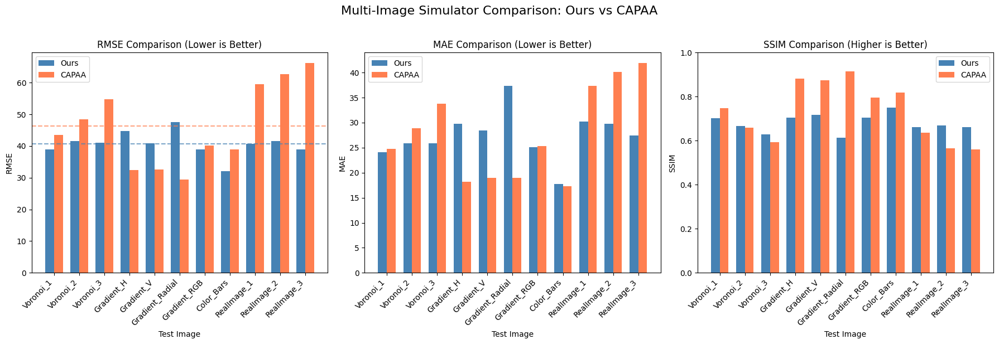

In [69]:
# ============================================================================
# Visualization: Bar Chart Comparison
# ============================================================================
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

x = np.arange(len(df_results))
width = 0.35

# RMSE Comparison
ax = axes[0]
bars1 = ax.bar(x - width/2, df_results['rmse_ours'], width, label='Ours', color='steelblue')
bars2 = ax.bar(x + width/2, df_results['rmse_capaa'], width, label='CAPAA', color='coral')
ax.set_xlabel('Test Image')
ax.set_ylabel('RMSE')
ax.set_title('RMSE Comparison (Lower is Better)')
ax.set_xticks(x)
ax.set_xticklabels(df_results['image_name'], rotation=45, ha='right')
ax.legend()
ax.axhline(y=df_results['rmse_ours'].mean(), color='steelblue', linestyle='--', alpha=0.7, label='Ours Mean')
ax.axhline(y=df_results['rmse_capaa'].mean(), color='coral', linestyle='--', alpha=0.7, label='CAPAA Mean')

# MAE Comparison
ax = axes[1]
bars1 = ax.bar(x - width/2, df_results['mae_ours'], width, label='Ours', color='steelblue')
bars2 = ax.bar(x + width/2, df_results['mae_capaa'], width, label='CAPAA', color='coral')
ax.set_xlabel('Test Image')
ax.set_ylabel('MAE')
ax.set_title('MAE Comparison (Lower is Better)')
ax.set_xticks(x)
ax.set_xticklabels(df_results['image_name'], rotation=45, ha='right')
ax.legend()

# SSIM Comparison
ax = axes[2]
bars1 = ax.bar(x - width/2, df_results['ssim_ours'], width, label='Ours', color='steelblue')
bars2 = ax.bar(x + width/2, df_results['ssim_capaa'], width, label='CAPAA', color='coral')
ax.set_xlabel('Test Image')
ax.set_ylabel('SSIM')
ax.set_title('SSIM Comparison (Higher is Better)')
ax.set_xticks(x)
ax.set_xticklabels(df_results['image_name'], rotation=45, ha='right')
ax.legend()
ax.set_ylim(0, 1)

plt.suptitle('Multi-Image Simulator Comparison: Ours vs CAPAA', fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig('multi_image_comparison_bars.png', dpi=150, bbox_inches='tight')
plt.show()

C:\Users\danny\AppData\Local\Temp\ipykernel_32024\2619330335.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


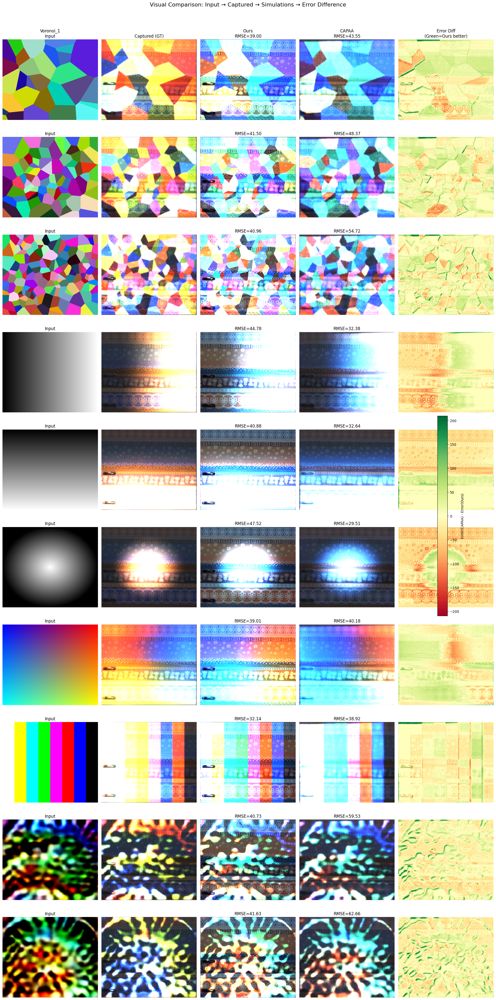

In [70]:
# ============================================================================
# Visual Grid: Input / Captured / Ours / CAPAA / Error Maps
# ============================================================================
n_images = min(10, len(test_images))  # Show at most 6 images
selected_names = list(test_images.keys())[:n_images]

fig, axes = plt.subplots(n_images, 5, figsize=(20, 4 * n_images))

for row, name in enumerate(selected_names):
    input_img = test_images[name]
    captured = cv2.cvtColor(captured_images[name], cv2.COLOR_BGR2RGB).astype(np.float32)
    ours = simulated_ours[name]
    capaa = simulated_capaa[name]
    
    # Error maps (absolute difference)
    error_ours = np.mean(np.abs(ours - captured), axis=2)
    error_capaa = np.mean(np.abs(capaa - captured), axis=2)
    
    # Column 0: Input
    axes[row, 0].imshow(np.clip(input_img, 0, 1))
    axes[row, 0].set_title(f'{name}\nInput' if row == 0 else 'Input')
    axes[row, 0].axis('off')
    if row == 0:
        axes[row, 0].set_ylabel(name)
    
    # Column 1: Captured (Ground Truth)
    axes[row, 1].imshow(np.clip(captured / 255, 0, 1))
    axes[row, 1].set_title('Captured (GT)' if row == 0 else '')
    axes[row, 1].axis('off')
    
    # Column 2: Ours Simulation
    axes[row, 2].imshow(np.clip(ours / 255, 0, 1))
    rmse_o = df_results[df_results['image_name'] == name]['rmse_ours'].values[0]
    axes[row, 2].set_title(f'Ours\nRMSE={rmse_o:.2f}' if row == 0 else f'RMSE={rmse_o:.2f}')
    axes[row, 2].axis('off')
    
    # Column 3: CAPAA Simulation
    axes[row, 3].imshow(np.clip(capaa / 255, 0, 1))
    rmse_c = df_results[df_results['image_name'] == name]['rmse_capaa'].values[0]
    axes[row, 3].set_title(f'CAPAA\nRMSE={rmse_c:.2f}' if row == 0 else f'RMSE={rmse_c:.2f}')
    axes[row, 3].axis('off')
    
    # Column 4: Error comparison (Ours - CAPAA)
    # Green: Ours better, Red: CAPAA better
    diff = error_capaa - error_ours  # Positive = Ours is better
    vmax = max(abs(diff.min()), abs(diff.max()), 20)
    im = axes[row, 4].imshow(diff, cmap='RdYlGn', vmin=-vmax, vmax=vmax)
    axes[row, 4].set_title('Error Diff\n(Green=Ours better)' if row == 0 else '')
    axes[row, 4].axis('off')

plt.colorbar(im, ax=axes[:, 4].tolist(), shrink=0.6, label='Error(CAPAA) - Error(Ours)')
plt.suptitle('Visual Comparison: Input → Captured → Simulations → Error Difference', fontsize=16, y=1.01)
plt.tight_layout()
plt.savefig('multi_image_comparison_grid.png', dpi=150, bbox_inches='tight')
plt.show()

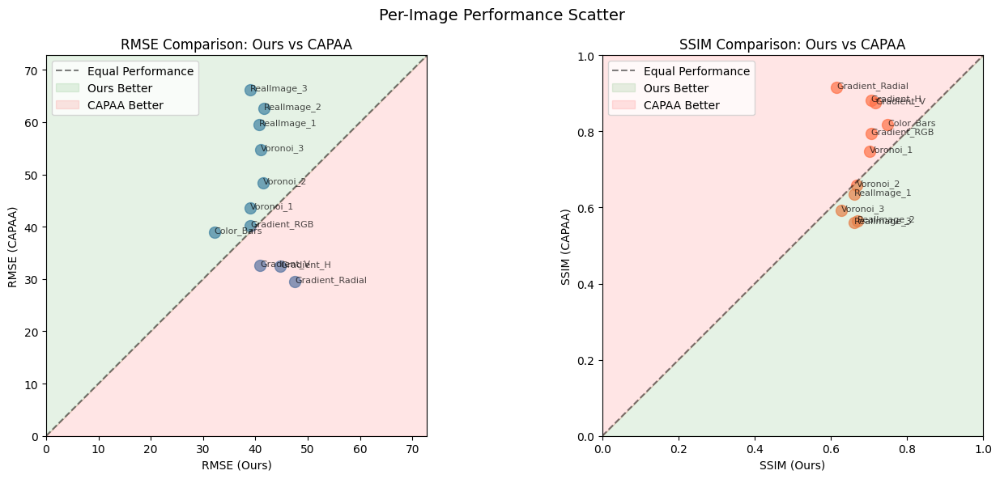

In [71]:
# ============================================================================
# Scatter Plot: Ours vs CAPAA performance
# ============================================================================
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# RMSE scatter
ax = axes[0]
ax.scatter(df_results['rmse_ours'], df_results['rmse_capaa'], s=100, alpha=0.7, c='steelblue')
for i, name in enumerate(df_results['image_name']):
    ax.annotate(name, (df_results['rmse_ours'].iloc[i], df_results['rmse_capaa'].iloc[i]), 
                fontsize=8, alpha=0.7)
max_rmse = max(df_results['rmse_ours'].max(), df_results['rmse_capaa'].max()) * 1.1
ax.plot([0, max_rmse], [0, max_rmse], 'k--', alpha=0.5, label='Equal Performance')
ax.fill_between([0, max_rmse], [0, max_rmse], [max_rmse, max_rmse], alpha=0.1, color='green', label='Ours Better')
ax.fill_between([0, max_rmse], [0, 0], [0, max_rmse], alpha=0.1, color='red', label='CAPAA Better')
ax.set_xlabel('RMSE (Ours)')
ax.set_ylabel('RMSE (CAPAA)')
ax.set_title('RMSE Comparison: Ours vs CAPAA')
ax.legend()
ax.set_xlim(0, max_rmse)
ax.set_ylim(0, max_rmse)
ax.set_aspect('equal')

# SSIM scatter
ax = axes[1]
ax.scatter(df_results['ssim_ours'], df_results['ssim_capaa'], s=100, alpha=0.7, c='coral')
for i, name in enumerate(df_results['image_name']):
    ax.annotate(name, (df_results['ssim_ours'].iloc[i], df_results['ssim_capaa'].iloc[i]), 
                fontsize=8, alpha=0.7)
ax.plot([0, 1], [0, 1], 'k--', alpha=0.5, label='Equal Performance')
ax.fill_between([0, 1], [0, 1], [0, 0], alpha=0.1, color='green', label='Ours Better')
ax.fill_between([0, 1], [0, 1], [1, 1], alpha=0.1, color='red', label='CAPAA Better')
ax.set_xlabel('SSIM (Ours)')
ax.set_ylabel('SSIM (CAPAA)')
ax.set_title('SSIM Comparison: Ours vs CAPAA')
ax.legend()
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_aspect('equal')

plt.suptitle('Per-Image Performance Scatter', fontsize=14)
plt.tight_layout()
plt.savefig('multi_image_comparison_scatter.png', dpi=150, bbox_inches='tight')
plt.show()

PERFORMANCE BY IMAGE CATEGORY
            rmse_ours        rmse_capaa        ssim_ours        ssim_capaa  \
                 mean    std       mean    std      mean    std       mean   
category                                                                     
Color Bars  32.137001    NaN  38.917999    NaN     0.750    NaN      0.818   
Gradient    43.046001  3.830  33.676998  4.560     0.686  0.048      0.867   
Real Image  40.433998  1.370  62.784000  3.313     0.664  0.005      0.587   
Voronoi     40.485001  1.314  48.880001  5.605     0.665  0.036      0.666   

                   
              std  
category           
Color Bars    NaN  
Gradient    0.051  
Real Image  0.042  
Voronoi     0.077  


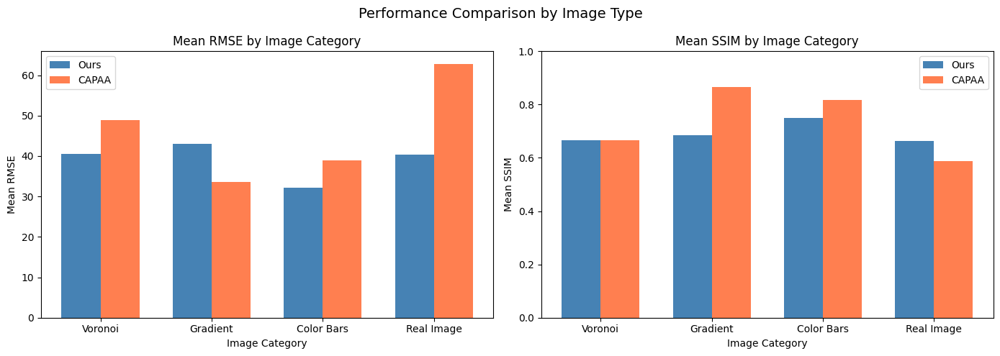

In [72]:
# ============================================================================
# Performance by Image Category
# ============================================================================

# Categorize images
def categorize_image(name):
    if 'Voronoi' in name:
        return 'Voronoi'
    elif 'Gradient' in name:
        return 'Gradient'
    elif 'Color_Bars' in name:
        return 'Color Bars'
    elif 'RealImage' in name:
        return 'Real Image'
    else:
        return 'Other'

df_results['category'] = df_results['image_name'].apply(categorize_image)

# Group by category
category_summary = df_results.groupby('category').agg({
    'rmse_ours': ['mean', 'std'],
    'rmse_capaa': ['mean', 'std'],
    'ssim_ours': ['mean', 'std'],
    'ssim_capaa': ['mean', 'std'],
}).round(3)

print("=" * 70)
print("PERFORMANCE BY IMAGE CATEGORY")
print("=" * 70)
print(category_summary)

# Bar chart by category
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

categories = df_results['category'].unique()
x = np.arange(len(categories))
width = 0.35

# RMSE by category
ax = axes[0]
rmse_ours_cat = [df_results[df_results['category'] == cat]['rmse_ours'].mean() for cat in categories]
rmse_capaa_cat = [df_results[df_results['category'] == cat]['rmse_capaa'].mean() for cat in categories]
ax.bar(x - width/2, rmse_ours_cat, width, label='Ours', color='steelblue')
ax.bar(x + width/2, rmse_capaa_cat, width, label='CAPAA', color='coral')
ax.set_xlabel('Image Category')
ax.set_ylabel('Mean RMSE')
ax.set_title('Mean RMSE by Image Category')
ax.set_xticks(x)
ax.set_xticklabels(categories)
ax.legend()

# SSIM by category
ax = axes[1]
ssim_ours_cat = [df_results[df_results['category'] == cat]['ssim_ours'].mean() for cat in categories]
ssim_capaa_cat = [df_results[df_results['category'] == cat]['ssim_capaa'].mean() for cat in categories]
ax.bar(x - width/2, ssim_ours_cat, width, label='Ours', color='steelblue')
ax.bar(x + width/2, ssim_capaa_cat, width, label='CAPAA', color='coral')
ax.set_xlabel('Image Category')
ax.set_ylabel('Mean SSIM')
ax.set_title('Mean SSIM by Image Category')
ax.set_xticks(x)
ax.set_xticklabels(categories)
ax.legend()
ax.set_ylim(0, 1)

plt.suptitle('Performance Comparison by Image Type', fontsize=14)
plt.tight_layout()
plt.savefig('multi_image_comparison_by_category.png', dpi=150, bbox_inches='tight')
plt.show()

In [73]:
# ============================================================================
# Save Results to CSV
# ============================================================================
output_csv_path = 'multi_image_simulator_comparison.csv'
df_results.to_csv(output_csv_path, index=False)
print(f"Results saved to {output_csv_path}")

# Final summary box
print("\n" + "=" * 70)
print("FINAL SUMMARY")
print("=" * 70)

ours_better_count = (df_results['rmse_ours'] < df_results['rmse_capaa']).sum()
total_images = len(df_results)
ours_pct = (ours_better_count / total_images) * 100

avg_rmse_improvement = (df_results['rmse_capaa'] - df_results['rmse_ours']).mean()
avg_ssim_improvement = (df_results['ssim_ours'] - df_results['ssim_capaa']).mean()

print(f"""
Test Images Evaluated: {total_images}
-----------------------------------------
RMSE:
  - Ours wins on {ours_better_count}/{total_images} images ({ours_pct:.1f}%)
  - Average improvement: {avg_rmse_improvement:.2f} (positive = Ours better)
  
SSIM:  
  - Ours wins on {(df_results['ssim_ours'] > df_results['ssim_capaa']).sum()}/{total_images} images
  - Average improvement: {avg_ssim_improvement:.4f} (positive = Ours better)

Overall:
  - Ours Mean RMSE: {df_results['rmse_ours'].mean():.2f}
  - CAPAA Mean RMSE: {df_results['rmse_capaa'].mean():.2f}
  - Ours Mean SSIM: {df_results['ssim_ours'].mean():.3f}
  - CAPAA Mean SSIM: {df_results['ssim_capaa'].mean():.3f}
""")
print("=" * 70)

Results saved to multi_image_simulator_comparison.csv

FINAL SUMMARY

Test Images Evaluated: 11
-----------------------------------------
RMSE:
  - Ours wins on 8/11 images (72.7%)
  - Average improvement: 5.59 (positive = Ours better)
  
SSIM:  
  - Ours wins on 5/11 images
  - Average improvement: -0.0514 (positive = Ours better)

Overall:
  - Ours Mean RMSE: 40.64
  - CAPAA Mean RMSE: 46.24
  - Ours Mean SSIM: 0.680
  - CAPAA Mean SSIM: 0.731



PER-CHANNEL RMSE ANALYSIS

Mean RMSE by Color Channel:
         rmse_ours  rmse_capaa
channel                       
Blue     93.289001   85.891998
Green    42.167000   42.469002
Red      80.805000   88.137001


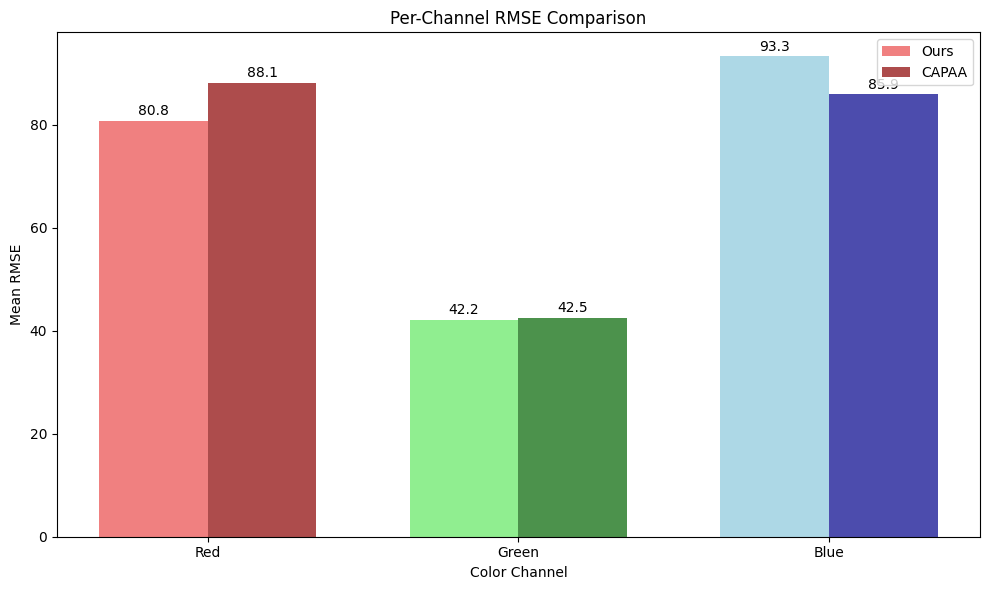

In [74]:
# ============================================================================
# Per-Channel Analysis
# ============================================================================
print("=" * 70)
print("PER-CHANNEL RMSE ANALYSIS")
print("=" * 70)

channel_results = {'image_name': [], 'channel': [], 'rmse_ours': [], 'rmse_capaa': []}

for name in df_results['image_name']:
    captured_rgb = cv2.cvtColor(captured_images[name], cv2.COLOR_BGR2RGB).astype(np.float32)
    ours = simulated_ours[name]
    capaa = simulated_capaa[name]
    
    for ch_idx, ch_name in enumerate(['Red', 'Green', 'Blue']):
        rmse_o = np.sqrt(np.mean((ours[:,:,ch_idx] - captured_rgb[:,:,ch_idx]) ** 2))
        rmse_c = np.sqrt(np.mean((capaa[:,:,ch_idx] - captured_rgb[:,:,ch_idx]) ** 2))
        
        channel_results['image_name'].append(name)
        channel_results['channel'].append(ch_name)
        channel_results['rmse_ours'].append(rmse_o)
        channel_results['rmse_capaa'].append(rmse_c)

df_channel = pd.DataFrame(channel_results)

# Summary by channel
channel_summary = df_channel.groupby('channel').agg({
    'rmse_ours': 'mean',
    'rmse_capaa': 'mean'
}).round(3)

print("\nMean RMSE by Color Channel:")
print(channel_summary)

# Plot per-channel comparison
fig, ax = plt.subplots(figsize=(10, 6))
channels = ['Red', 'Green', 'Blue']
x = np.arange(len(channels))
width = 0.35

ours_by_ch = [df_channel[df_channel['channel'] == ch]['rmse_ours'].mean() for ch in channels]
capaa_by_ch = [df_channel[df_channel['channel'] == ch]['rmse_capaa'].mean() for ch in channels]

bars1 = ax.bar(x - width/2, ours_by_ch, width, label='Ours', color=['lightcoral', 'lightgreen', 'lightblue'])
bars2 = ax.bar(x + width/2, capaa_by_ch, width, label='CAPAA', color=['darkred', 'darkgreen', 'darkblue'], alpha=0.7)

ax.set_xlabel('Color Channel')
ax.set_ylabel('Mean RMSE')
ax.set_title('Per-Channel RMSE Comparison')
ax.set_xticks(x)
ax.set_xticklabels(channels)
ax.legend()

# Add value labels
for bar, val in zip(bars1, ours_by_ch):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5, f'{val:.1f}', 
            ha='center', va='bottom', fontsize=10)
for bar, val in zip(bars2, capaa_by_ch):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5, f'{val:.1f}', 
            ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.savefig('multi_image_comparison_per_channel.png', dpi=150, bbox_inches='tight')
plt.show()

In [111]:
# ============================================================================
# Color Confusion Matrix - RMSE: Input Color vs Base Color
# ============================================================================
from sklearn.cluster import KMeans

# Capture base frame (project gray to get surface colors)
print("Capturing base frame (projecting gray)...")
base_cap = project_and_capture(system, 0.3*np.ones((H, W, 3), dtype=np.float32), n_captures=3, delay=0.3)


Capturing base frame (projecting gray)...


In [131]:
base_cap = (((base_cap.astype(np.float32) / 255.0) * 2).clip(0, 1) * 255.0).astype(np.uint8)

In [137]:

def extract_dominant_colors_from_image(img, n_colors=8, sample_fraction=1.0):
    """Extract dominant colors from a single image using K-means."""
    if img.max() > 1.0:
        img = img.astype(np.float32) / 255.0
    
    pixels = img.reshape(-1, 3)
    n_samples = int(len(pixels) * sample_fraction)
    indices = np.random.choice(len(pixels), n_samples, replace=False)
    sampled = pixels[indices]
    
    kmeans = KMeans(n_clusters=n_colors, random_state=42, n_init=10)
    kmeans.fit(sampled)
    
    # Sort by luminance for better visualization
    centers = kmeans.cluster_centers_
    luminance = 0.299 * centers[:, 0] + 0.587 * centers[:, 1] + 0.114 * centers[:, 2]
    sort_idx = np.argsort(luminance)
    centers = centers[sort_idx]
    
    return centers

def extract_dominant_colors_from_dict(images_dict, n_colors=15, sample_fraction=0.05):
    """Extract dominant colors from all images in dict."""
    all_pixels = []
    for name, img in images_dict.items():
        if img.max() > 1.0:
            img = img.astype(np.float32) / 255.0
        pixels = img.reshape(-1, 3)
        n_samples = int(len(pixels) * sample_fraction)
        indices = np.random.choice(len(pixels), n_samples, replace=False)
        all_pixels.append(pixels[indices])
    
    all_pixels = np.vstack(all_pixels)
    kmeans = KMeans(n_clusters=n_colors, random_state=42, n_init=10)
    kmeans.fit(all_pixels)
    
    centers = kmeans.cluster_centers_
    luminance = 0.299 * centers[:, 0] + 0.587 * centers[:, 1] + 0.114 * centers[:, 2]
    sort_idx = np.argsort(luminance)
    return centers[sort_idx]

def assign_to_cluster(pixels, cluster_centers):
    """Assign pixels to nearest cluster center."""
    dists = np.linalg.norm(pixels[:, None, :] - cluster_centers[None, :, :], axis=2)
    return np.argmin(dists, axis=1)

def build_input_vs_base_rmse_matrix(input_images, sim_images, captured_images, 
                                     input_colors, base_colors, base_cap_img):
    """
    Build RMSE matrix: rows = input color, cols = base color.
    For each pixel, find which input color cluster it belongs to,
    and which base color cluster that location has in base_cap.
    """
    n_input = len(input_colors)
    n_base = len(base_colors)
    
    error_sum = np.zeros((n_input, n_base), dtype=np.float64)
    count_matrix = np.zeros((n_input, n_base), dtype=np.float64)
    
    # Normalize base_cap
    if base_cap_img.max() > 1.0:
        base_cap_norm = base_cap_img.astype(np.float32) / 255.0
    else:
        base_cap_norm = base_cap_img.astype(np.float32)
    
    # Assign base pixels to base color clusters (once, since it's the same for all images)
    base_flat = base_cap_norm.reshape(-1, 3)
    base_clusters = assign_to_cluster(base_flat, base_colors)
    base_clusters_2d = base_clusters.reshape(base_cap_norm.shape[:2])
    
    for name in input_images.keys():
        if name not in sim_images or name not in captured_images:
            continue
        
        inp = input_images[name]
        sim = sim_images[name]
        cap = captured_images[name]
        
        # Normalize
        if inp.max() > 1.0:
            inp = inp.astype(np.float32) / 255.0
        if sim.max() > 1.0:
            sim = sim.astype(np.float32) / 255.0
        if cap.max() > 1.0:
            cap = cap.astype(np.float32) / 255.0
        
        h, w = inp.shape[:2]
        inp_flat = inp.reshape(-1, 3)
        sim_flat = sim.reshape(-1, 3)
        cap_flat = cap.reshape(-1, 3)
        
        # Assign input pixels to input color clusters
        inp_clusters = assign_to_cluster(inp_flat, input_colors)
        
        # Per-pixel squared error
        pixel_se = np.sum((sim_flat - cap_flat) ** 2, axis=1)
        
        # Accumulate by (input_color, base_color) pair
        for i in range(len(inp_flat)):
            y, x = divmod(i, w)
            inp_c = inp_clusters[i]
            base_c = base_clusters_2d[y, x]
            error_sum[inp_c, base_c] += pixel_se[i]
            count_matrix[inp_c, base_c] += 1
    
    rmse_matrix = np.sqrt(error_sum / (count_matrix + 1e-8)) * 255
    rmse_matrix[count_matrix < 10] = np.nan
    
    return rmse_matrix, count_matrix

# Extract dominant colors
n_input_colors = 15
n_base_colors = 15

print(f"Extracting {n_input_colors} dominant INPUT colors...")
input_colors = extract_dominant_colors_from_dict(test_images, n_colors=n_input_colors)

print(f"Extracting {n_base_colors} dominant BASE colors from base_cap...")
base_colors = extract_dominant_colors_from_image(base_cap, n_colors=n_base_colors)

print("\nBuilding RMSE Matrix for OURS...")
rmse_ours, counts_ours = build_input_vs_base_rmse_matrix(
    test_images, simulated_ours, captured_images, input_colors, base_colors, base_cap)

print("Building RMSE Matrix for CAPAA...")
rmse_capaa, counts_capaa = build_input_vs_base_rmse_matrix(
    test_images, simulated_capaa, captured_images, input_colors, base_colors, base_cap)


Extracting 15 dominant INPUT colors...
Extracting 15 dominant BASE colors from base_cap...

Building RMSE Matrix for OURS...
Building RMSE Matrix for CAPAA...


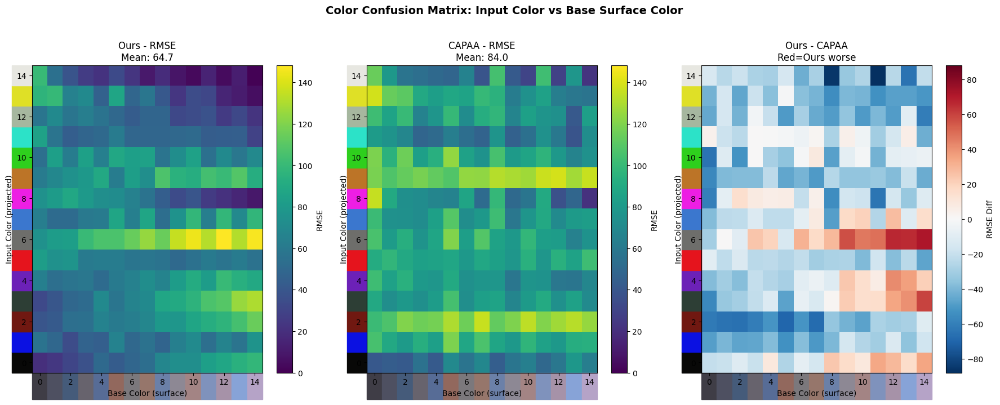

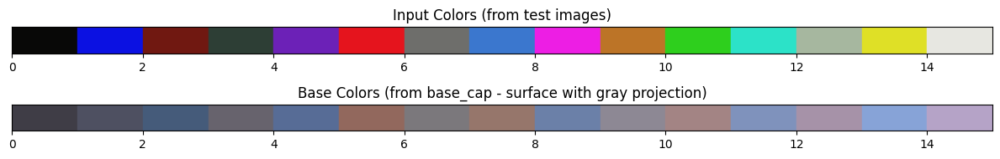


Mean RMSE - Ours: 64.69, CAPAA: 84.05


In [138]:

# Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 7))
vmax = max(np.nanmax(rmse_ours), np.nanmax(rmse_capaa))

# scale base colors 
base_colors_linear = base_colors#(base_colors/ base_colors.max(1)[:, None] ) * 0.5 

for ax_idx, (ax, data, title) in enumerate(zip(axes[:2], [rmse_ours, rmse_capaa], ['Ours', 'CAPAA'])):
    im = ax.imshow(data, cmap='viridis', aspect='auto', origin='lower', vmin=0, vmax=vmax)
    ax.set_xlabel('Base Color (surface)')
    ax.set_ylabel('Input Color (projected)')
    ax.set_title(f'{title} - RMSE\nMean: {np.nanmean(data):.1f}')
    plt.colorbar(im, ax=ax, label='RMSE')
    
    # Add color swatches on axes
    for i, c in enumerate(base_colors_linear):
        ax.add_patch(plt.Rectangle((i-0.5, -1.8), 1, 1.3, color=c, clip_on=False))
    for i, c in enumerate(input_colors):
        ax.add_patch(plt.Rectangle((-1.8, i-0.5), 1.3, 1, color=c, clip_on=False))

# Difference
ax = axes[2]
diff = rmse_ours - rmse_capaa
diff_max = np.nanmax(np.abs(diff))
im = ax.imshow(diff, cmap='RdBu_r', aspect='auto', origin='lower', vmin=-diff_max, vmax=diff_max)
ax.set_xlabel('Base Color (surface)')
ax.set_ylabel('Input Color (projected)')
ax.set_title('Ours - CAPAA\nRed=Ours worse')
plt.colorbar(im, ax=ax, label='RMSE Diff')
for i, c in enumerate(base_colors_linear):
    ax.add_patch(plt.Rectangle((i-0.5, -1.8), 1, 1.3, color=c, clip_on=False))
for i, c in enumerate(input_colors):
    ax.add_patch(plt.Rectangle((-1.8, i-0.5), 1.3, 1, color=c, clip_on=False))

plt.suptitle('Color Confusion Matrix: Input Color vs Base Surface Color', y=1.02, fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Show color palettes
fig2, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 2))
for i, c in enumerate(input_colors):
    ax1.add_patch(plt.Rectangle((i, 0), 1, 1, color=c))
ax1.set_xlim(0, n_input_colors)
ax1.set_ylim(0, 1)
ax1.set_yticks([])
ax1.set_title('Input Colors (from test images)')

for i, c in enumerate(base_colors_linear):
    ax2.add_patch(plt.Rectangle((i, 0), 1, 1, color=c))
ax2.set_xlim(0, n_base_colors)
ax2.set_ylim(0, 1)
ax2.set_yticks([])
ax2.set_title('Base Colors (from base_cap - surface with gray projection)')
plt.tight_layout()
plt.show()

print(f"\nMean RMSE - Ours: {np.nanmean(rmse_ours):.2f}, CAPAA: {np.nanmean(rmse_capaa):.2f}")

In [140]:
# ============================================================================
# Save All Captured Data for Reproducibility
# ============================================================================
import pickle
from datetime import datetime

# Create a dictionary with all relevant data
comparison_data = {
    # Metadata
    'timestamp': datetime.now().isoformat(),
    'description': 'Multi-image simulator comparison data (Ours vs CAPAA)',
    
    # Test images (inputs)
    'test_images': test_images,
    
    # Captured images (ground truth from real projection)
    'captured_images': captured_images,
    
    # Simulated outputs
    'simulated_ours': simulated_ours,
    'simulated_capaa': simulated_capaa,
    
    # Base frames
    'base_frame': base_frame,
    'base_frame_unwarped': base_frame_unwarped,
    'base_cap': base_cap if 'base_cap' in dir() else None,
    
    # Homography
    'H': system.H,
    'inv_h': inv_h,
    
    # Results dataframe
    'df_results': df_results,
    
    # Configuration
    'width_margin': width_margin,
    'H_proj': H,
    'W_proj': W,
    
    # Color analysis data (if exists)
    'input_colors': input_colors if 'input_colors' in dir() else None,
    'base_colors': base_colors if 'base_colors' in dir() else None,
    'rmse_ours_matrix': rmse_ours if 'rmse_ours' in dir() else None,
    'rmse_capaa_matrix': rmse_capaa if 'rmse_capaa' in dir() else None,
}

# Save to pickle
output_path = f'comparison_data_{datetime.now().strftime("%Y%m%d_%H%M%S")}.pkl'
with open(output_path, 'wb') as f:
    pickle.dump(comparison_data, f)

print(f"Data saved to: {output_path}")
print(f"\nSaved contents:")
for key, val in comparison_data.items():
    if val is None:
        print(f"  - {key}: None")
    elif isinstance(val, dict):
        print(f"  - {key}: dict with {len(val)} items")
    elif isinstance(val, np.ndarray):
        print(f"  - {key}: ndarray {val.shape} {val.dtype}")
    elif hasattr(val, 'shape'):
        print(f"  - {key}: {type(val).__name__} {val.shape}")
    else:
        print(f"  - {key}: {type(val).__name__}")

print(f"\nFile size: {os.path.getsize(output_path) / 1024 / 1024:.2f} MB")

Data saved to: comparison_data_20260111_212813.pkl

Saved contents:
  - timestamp: str
  - description: str
  - test_images: dict with 11 items
  - captured_images: dict with 11 items
  - simulated_ours: dict with 11 items
  - simulated_capaa: dict with 11 items
  - base_frame: ndarray (480, 640, 3) uint8
  - base_frame_unwarped: ndarray (608, 720, 3) uint8
  - base_cap: ndarray (608, 720, 3) uint8
  - H: ndarray (3, 3) float64
  - inv_h: ndarray (3, 3) float64
  - df_results: DataFrame (11, 8)
  - width_margin: int
  - H_proj: int64 ()
  - W_proj: int64 ()
  - input_colors: ndarray (15, 3) float32
  - base_colors: ndarray (15, 3) float32
  - rmse_ours_matrix: ndarray (15, 15) float64
  - rmse_capaa_matrix: ndarray (15, 15) float64

File size: 99.83 MB
